# Clusterização utilizando K-Means, DBSCAN e Hierarchical - Base de Dados Pessoa Física 

In [2]:
#importando biblotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import (
    KMeans, DBSCAN
)
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer

In [8]:
df_pf = pd.read_csv('PF_tratados.csv')
#df_pf = pd.read_csv('../dados/PF_tratados.csv')
df_pf.head()

FileNotFoundError: [Errno 2] No such file or directory: 'PF_tratados.csv'

In [ ]:
# Encontre o índice da linha com o valor máximo de 'Tempo de Contrato'
indice_max_tempo_contrato = df_pf['Tempo de Contrato'].idxmax()

# Use o índice para excluir a linha do DataFrame
df_pf = df_pf.drop(indice_max_tempo_contrato)

In [ ]:
df_pf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83871 entries, 0 to 83871
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   ID Cliente                      83871 non-null  int64  
 1   Linha de Ação                   83871 non-null  object 
 2   Produto GPOM                    83871 non-null  object 
 3   Data de Venda                   83871 non-null  object 
 4   Classe de Serviço               83871 non-null  object 
 5   Data de Nascimento              83871 non-null  object 
 6   Gênero                          83871 non-null  object 
 7   Cidade                          83871 non-null  object 
 8   Microrregião                    83871 non-null  object 
 9   Estado                          83871 non-null  object 
 10  Fim de Vigência                 83871 non-null  object 
 11  Tipo Pessoa                     83871 non-null  object 
 12  Área de Atuação                 

In [ ]:
df_pf.describe()

,ID Cliente,Idade,Tempo de Contrato,Longitude,Latitude
count,83871.00000,83871.000000,83871.000000,83871.000000,83871.000000
mean,50537.25141,24.114140,198.977740,-50.423973,-24.960611
std,28783.46465,10.221791,123.216886,1.634777,1.042044
min,4.00000,0.000000,-666.000000,-70.772154,-31.764898
25%,25930.00000,16.000000,139.000000,-51.462317,-25.442949
50%,50902.00000,21.000000,166.000000,-49.307310,-25.419547
75%,74989.00000,30.000000,221.000000,-49.264622,-24.557891
max,99999.00000,78.000000,2356.000000,-34.864121,2.823842


In [ ]:
# viewing descriptive df_pf
desc = pd.DataFrame(index=list(df_pf))
desc['count'] = df_pf.count()
desc['nunique'] = df_pf.nunique()
desc['%unique'] = df_pf.nunique() / len(df_pf) * 100
desc['null'] = df_pf.isnull().sum()
desc['type'] = df_pf.dtypes
desc = pd.concat([desc, df_pf.describe().T.drop('count', axis=1)], axis=1)
desc

,count,nunique,%unique,null,type,mean,std,min,25%,50%,75%,max
ID Cliente,83871,13888,16.558763,0,int64,50537.251410,28783.464650,4.000000,25930.000000,50902.000000,74989.000000,99999.000000
Linha de Ação,83871,3,0.003577,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Produto GPOM,83871,33,0.039346,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Data de Venda,83871,892,1.063538,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Classe de Serviço,83871,42,0.050077,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Data de Nascimento,83871,13919,16.595724,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gênero,83871,2,0.002385,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Cidade,83871,574,0.684384,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Microrregião,83871,37,0.044115,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Estado,83871,25,0.029808,0,object,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Pré-processamento

In [ ]:
s = (df_pf.dtypes == 'object')
object_cols = list(s[s].index)

print("Variáveis categóricas na base de dados:", object_cols)



Variáveis categóricas na base de dados: ['Linha de Ação', 'Produto GPOM', 'Data de Venda', 'Classe de Serviço', 'Data de Nascimento', 'Gênero', 'Cidade', 'Microrregião', 'Estado', 'Fim de Vigência', 'Tipo Pessoa', 'Área de Atuação', 'Área de Atuação e Produto GPOM']


In [ ]:


LE=LabelEncoder()
for i in object_cols:
    df_pf[i]=df_pf[[i]].apply(LE.fit_transform)



In [ ]:
df_pf.head()

,ID Cliente,Linha de Ação,Produto GPOM,Data de Venda,Classe de Serviço,Data de Nascimento,Gênero,Cidade,Microrregião,Estado,Fim de Vigência,Tipo Pessoa,Área de Atuação,Área de Atuação e Produto GPOM,Idade,Tempo de Contrato,Longitude,Latitude
0,56943,0,10,562,15,12147,1,140,10,16,972,0,17,40,14,413,-49.264622,-25.419547
1,19906,0,17,626,9,3075,0,140,10,16,982,0,17,47,41,346,-49.264622,-25.419547
2,19906,0,20,237,12,3075,0,140,10,16,634,0,17,50,40,433,-49.264622,-25.419547
3,19906,0,20,626,12,3075,0,140,10,16,982,0,17,50,41,346,-49.264622,-25.419547
4,6940,0,8,242,14,11593,0,140,10,16,634,0,17,38,14,426,-49.264622,-25.419547


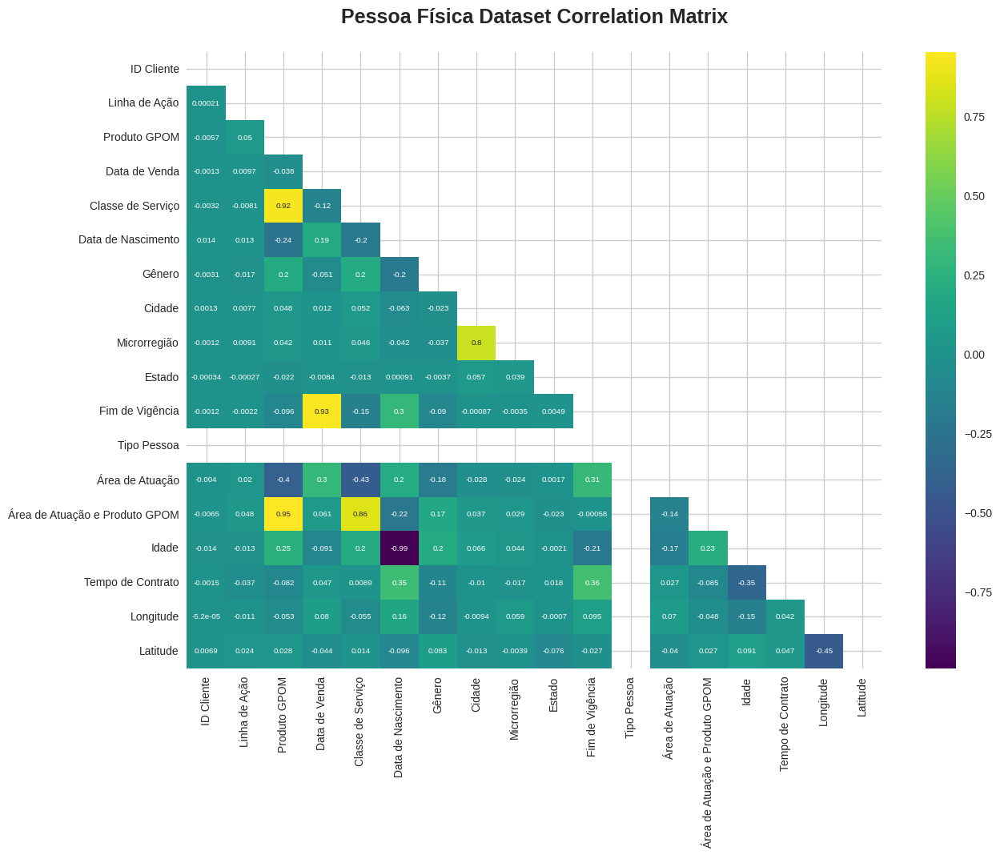

In [ ]:


def heatmap(dataset, label = None):
    corr = dataset.corr(method = 'spearman')
    plt.figure(figsize = (14, 10), dpi = 100)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(corr, mask = mask, cmap = 'viridis', annot = True, annot_kws = {'size' : 7})
    plt.title(f'{label} Dataset Correlation Matrix\n', fontsize = 18, weight = 'bold')
    plt.show()
heatmap(df_pf, 'Pessoa Física')



In [ ]:
df_pf.columns

Index(['ID Cliente', 'Linha de Ação', 'Produto GPOM', 'Data de Venda',
       'Classe de Serviço', 'Data de Nascimento', 'Gênero', 'Cidade',
       'Microrregião', 'Estado', 'Fim de Vigência', 'Tipo Pessoa',
       'Área de Atuação', 'Área de Atuação e Produto GPOM', 'Idade',
       'Tempo de Contrato', 'Longitude', 'Latitude'],
      dtype='object')

In [ ]:

# Calcule a frequência de compras para cada cliente
frequencia_compras = df_pf.groupby(['ID Cliente', 'Data de Nascimento'])['Data de Venda'].count().reset_index()
frequencia_compras.columns = ['ID Cliente', 'Data de Nascimento', 'Frequencia Compras']
df_pf = pd.merge(df_pf, frequencia_compras, on=['ID Cliente', 'Data de Nascimento'], how='left')




In [ ]:
cols_del = ['Data de Venda', 'Data de Nascimento', 'Fim de Vigência', 'Tipo Pessoa','Longitude', 'Latitude']
df_pf = df_pf.drop(cols_del, axis=1)

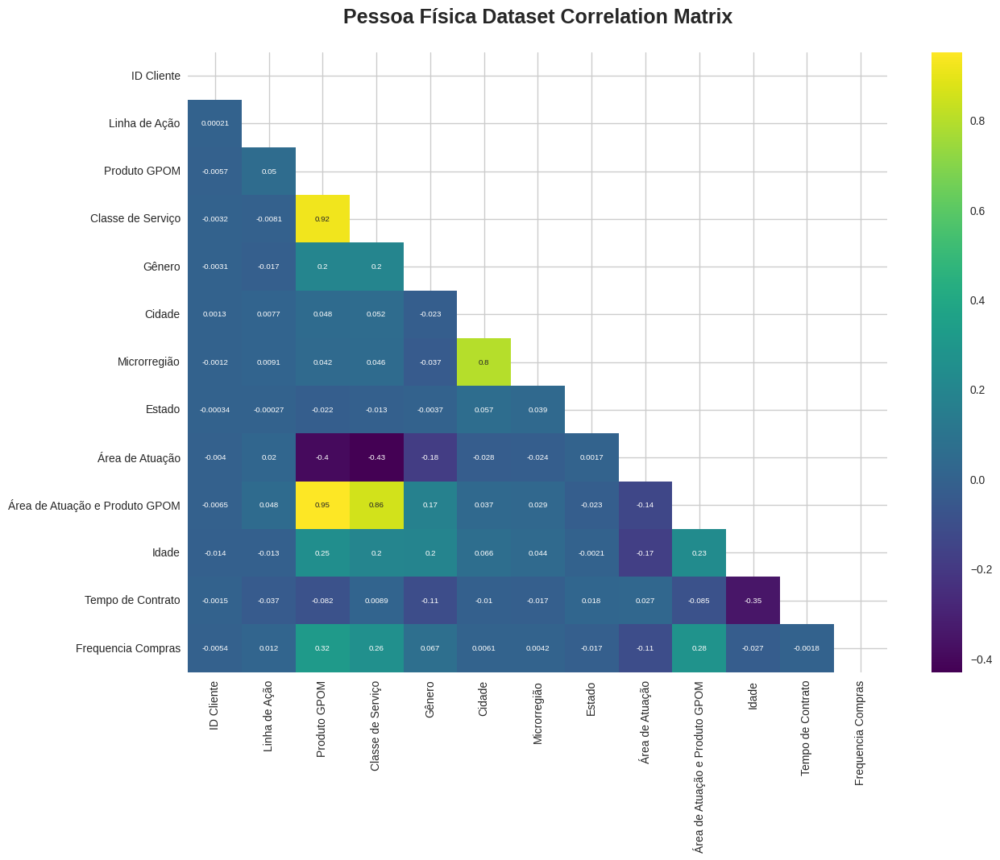

In [ ]:


heatmap(df_pf, 'Pessoa Física')



In [ ]:
df_pf

,ID Cliente,Linha de Ação,Produto GPOM,Classe de Serviço,Gênero,Cidade,Microrregião,Estado,Área de Atuação,Área de Atuação e Produto GPOM,Idade,Tempo de Contrato,Frequencia Compras
0,56943,0,10,15,1,140,10,16,17,40,14,413,1
1,19906,0,17,9,0,140,10,16,17,47,41,346,3
2,19906,0,20,12,0,140,10,16,17,50,40,433,3
3,19906,0,20,12,0,140,10,16,17,50,41,346,3
4,6940,0,8,14,0,140,10,16,17,38,14,426,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83866,13908,0,30,39,1,44,30,16,14,86,41,176,1
83867,60900,0,1,1,1,222,6,16,7,17,29,11,1
83868,1045,0,1,1,1,135,20,21,2,13,19,85,1
83869,69940,0,1,1,1,306,24,16,20,30,30,4,1


## Normalização

In [ ]:
scaler = StandardScaler()
scaler.fit(df_pf)
scaled_df_pf = pd.DataFrame(scaler.transform(df_pf),columns= df_pf.columns )
print("Todos os atributos estão normalizados")

Todos os atributos estão normalizados


In [ ]:
scaled_df_pf

,ID Cliente,Linha de Ação,Produto GPOM,Classe de Serviço,Gênero,Cidade,Microrregião,Estado,Área de Atuação,Área de Atuação e Produto GPOM,Idade,Tempo de Contrato,Frequencia Compras
0,0.222551,-0.042048,-1.093599,-0.826452,0.564908,-0.744418,-0.689030,-0.052528,0.481198,-1.018850,-0.989474,1.736966,-1.095264
1,-1.064202,-0.042048,-0.423165,-1.272559,-1.770201,-0.744418,-0.689030,-0.052528,0.481198,-0.713979,1.651957,1.193206,0.187118
2,-1.064202,-0.042048,-0.135837,-1.049506,-1.770201,-0.744418,-0.689030,-0.052528,0.481198,-0.583320,1.554126,1.899282,0.187118
3,-1.064202,-0.042048,-0.135837,-1.049506,-1.770201,-0.744418,-0.689030,-0.052528,0.481198,-0.583320,1.651957,1.193206,0.187118
4,-1.514672,-0.042048,-1.285151,-0.900803,-1.770201,-0.744418,-0.689030,-0.052528,0.481198,-1.105956,-0.989474,1.842472,0.828309
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83866,-1.272587,-0.042048,0.821925,0.957976,0.564908,-1.348104,1.366739,-0.052528,-0.057084,0.984587,1.651957,-0.186483,-1.095264
83867,0.360027,-0.042048,-1.955585,-1.867368,0.564908,-0.228770,-1.100183,-0.052528,-1.313075,-2.020568,0.477988,-1.525593,-1.095264
83868,-1.719478,-0.042048,-1.955585,-1.867368,0.564908,-0.775860,0.338855,6.443410,-2.210211,-2.194780,-0.500320,-0.925023,-1.095264
83869,0.674098,-0.042048,-1.955585,-1.867368,0.564908,0.299454,0.750008,-0.052528,1.019480,-1.454380,0.575818,-1.582404,-1.095264


In [ ]:
df_pf

,ID Cliente,Linha de Ação,Produto GPOM,Classe de Serviço,Gênero,Cidade,Microrregião,Estado,Área de Atuação,Área de Atuação e Produto GPOM,Idade,Tempo de Contrato,Frequencia Compras
0,56943,0,10,15,1,140,10,16,17,40,14,413,1
1,19906,0,17,9,0,140,10,16,17,47,41,346,3
2,19906,0,20,12,0,140,10,16,17,50,40,433,3
3,19906,0,20,12,0,140,10,16,17,50,41,346,3
4,6940,0,8,14,0,140,10,16,17,38,14,426,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83866,13908,0,30,39,1,44,30,16,14,86,41,176,1
83867,60900,0,1,1,1,222,6,16,7,17,29,11,1
83868,1045,0,1,1,1,135,20,21,2,13,19,85,1
83869,69940,0,1,1,1,306,24,16,20,30,30,4,1


In [ ]:
df_pf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83871 entries, 0 to 83870
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   ID Cliente                      83871 non-null  int64
 1   Linha de Ação                   83871 non-null  int64
 2   Produto GPOM                    83871 non-null  int64
 3   Classe de Serviço               83871 non-null  int64
 4   Gênero                          83871 non-null  int64
 5   Cidade                          83871 non-null  int64
 6   Microrregião                    83871 non-null  int64
 7   Estado                          83871 non-null  int64
 8   Área de Atuação                 83871 non-null  int64
 9   Área de Atuação e Produto GPOM  83871 non-null  int64
 10  Idade                           83871 non-null  int64
 11  Tempo de Contrato               83871 non-null  int64
 12  Frequencia Compras              83871 non-null  int64
dtypes

In [ ]:
pca = PCA(n_components=4)
pca.fit(scaled_df_pf)
PCA_df_pf = pca.fit_transform(scaled_df_pf)

## Hierarchical 

**Dendrograma**

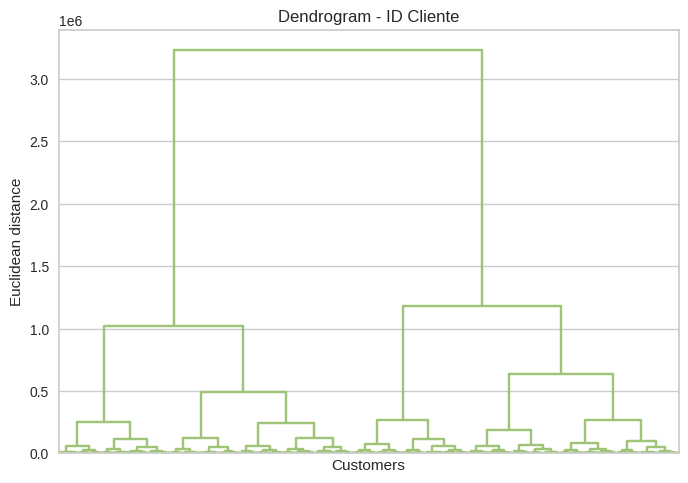

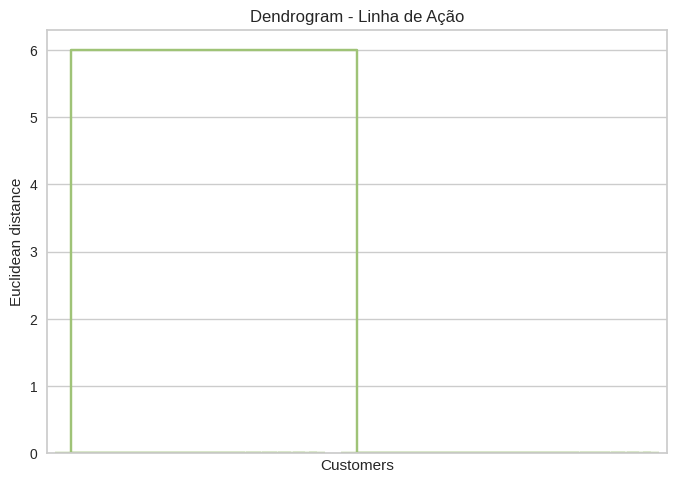

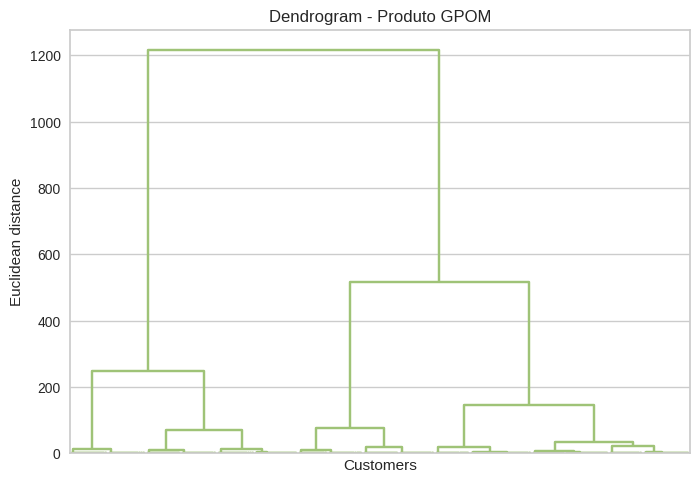

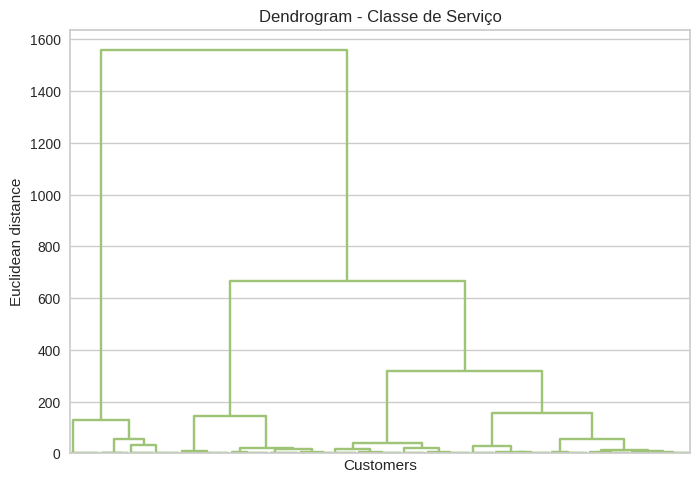

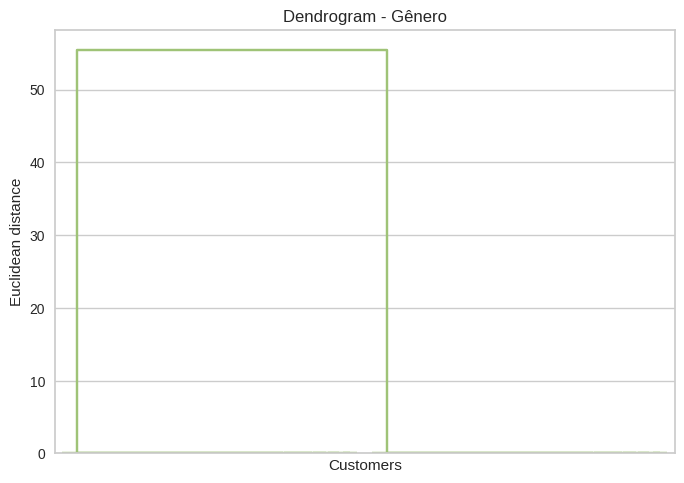

...

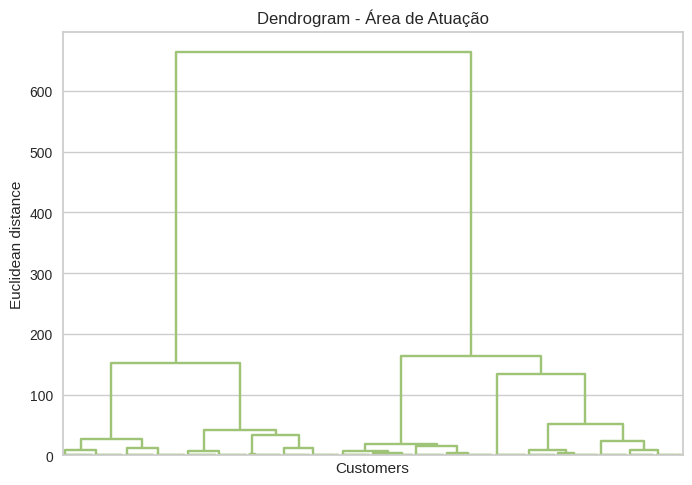

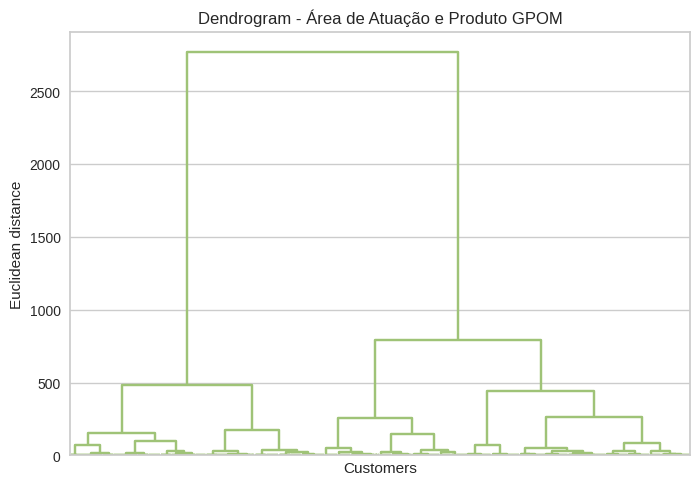

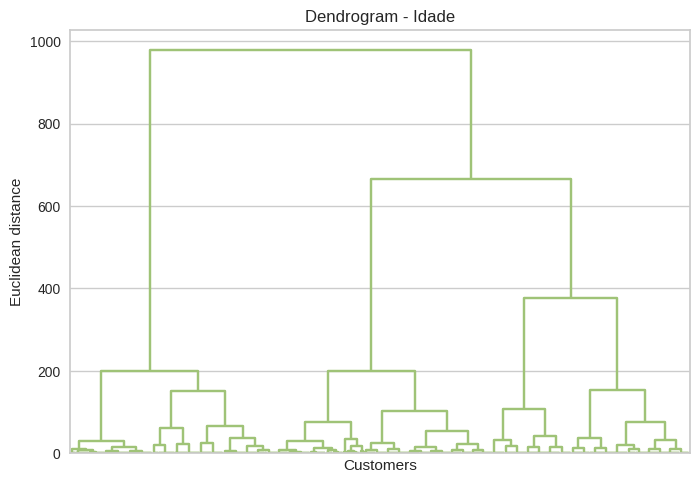

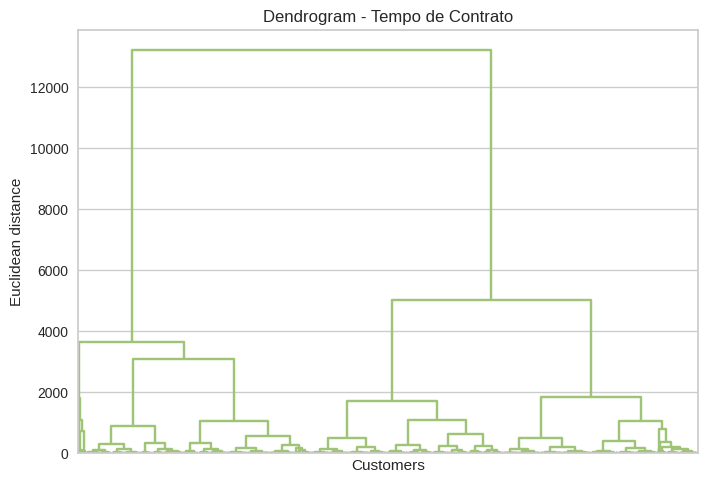

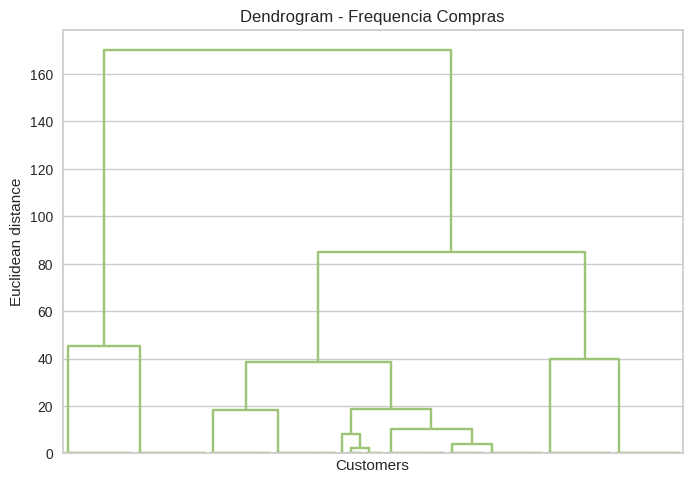

In [ ]:
import scipy.cluster.hierarchy as sch
import numpy as np
import matplotlib.pyplot as plt

# Supondo que 'df_pf' seja o seu DataFrame
colunas = ['ID Cliente', 'Linha de Ação', 'Produto GPOM', 'Classe de Serviço',
           'Gênero', 'Cidade', 'Microrregião', 'Estado', 'Área de Atuação',
           'Área de Atuação e Produto GPOM', 'Idade', 'Tempo de Contrato',
           'Frequencia Compras']

# Subamostragem global
subsample_percentage = 10
num_samples = int(len(df_pf) * (subsample_percentage / 100.0))
subsample_indices = np.random.choice(len(df_pf), num_samples, replace=False)

# Iterar sobre cada coluna e gerar o dendrograma
for coluna in colunas:
    X = df_pf[coluna].values.reshape(-1, 1)  # Reshape para garantir que seja uma matriz 2D

    # Subamostragem específica para cada coluna
    X_subsampled = X[subsample_indices, :]

    # Calcular o dendrograma com alguns parâmetros ajustados
    dendrogram = sch.dendrogram(sch.linkage(X_subsampled, method='ward', metric='euclidean'),
                                color_threshold=np.inf,  # Removendo a cor automática
                                truncate_mode='level',  # Ajustando o modo de truncamento
                                p=20,  # Limitando a quantidade de folhas no último nível
                                no_labels=True)

    plt.title(f'Dendrogram - {coluna}')
    plt.xlabel('Customers')
    plt.ylabel('Euclidean distance')
    plt.show()


**Agglomerative Clustering**

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



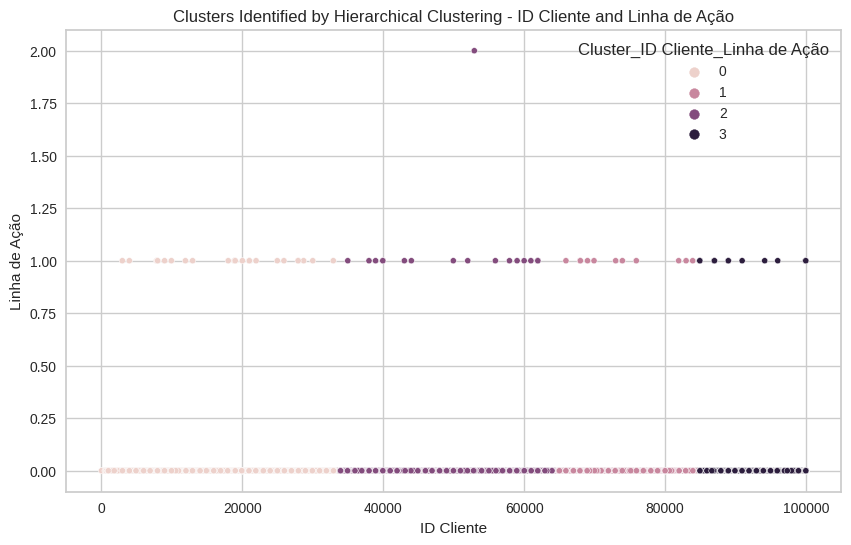

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



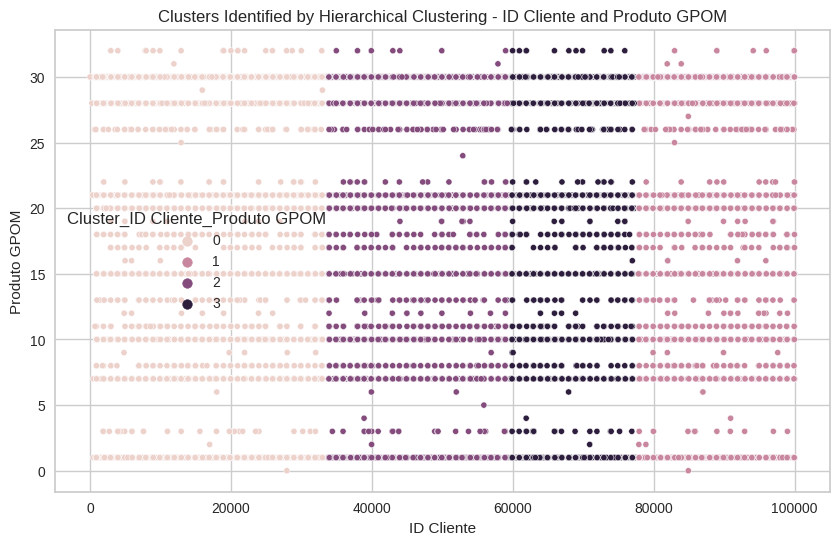

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



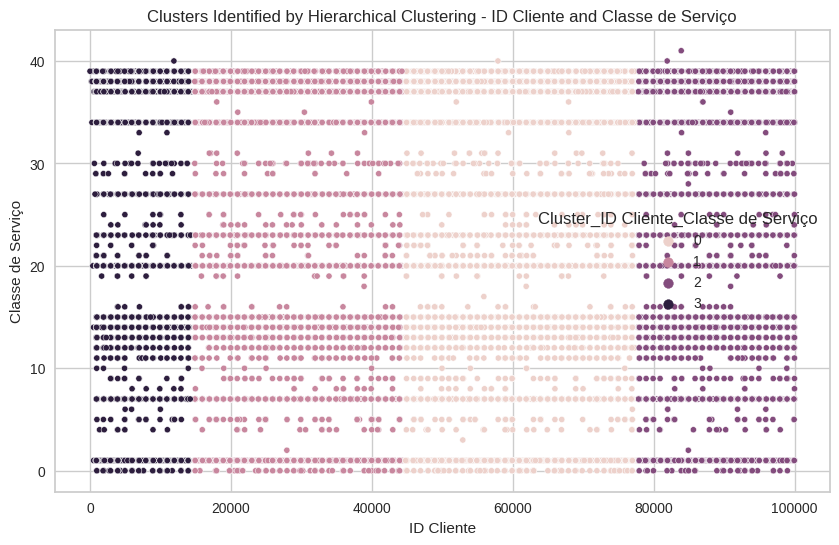

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



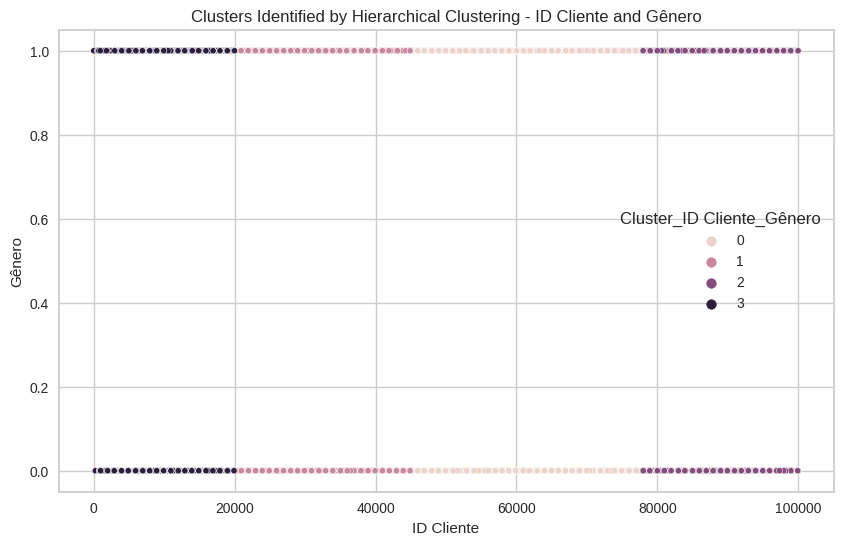

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



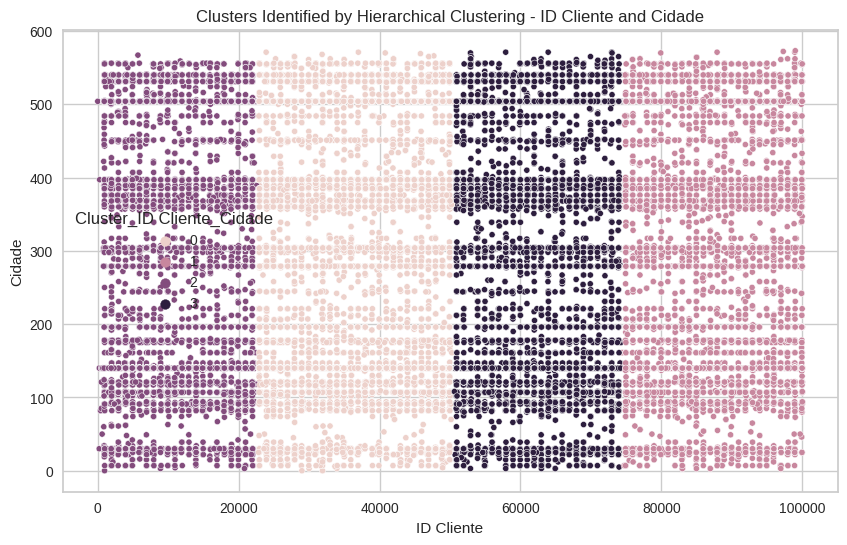

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



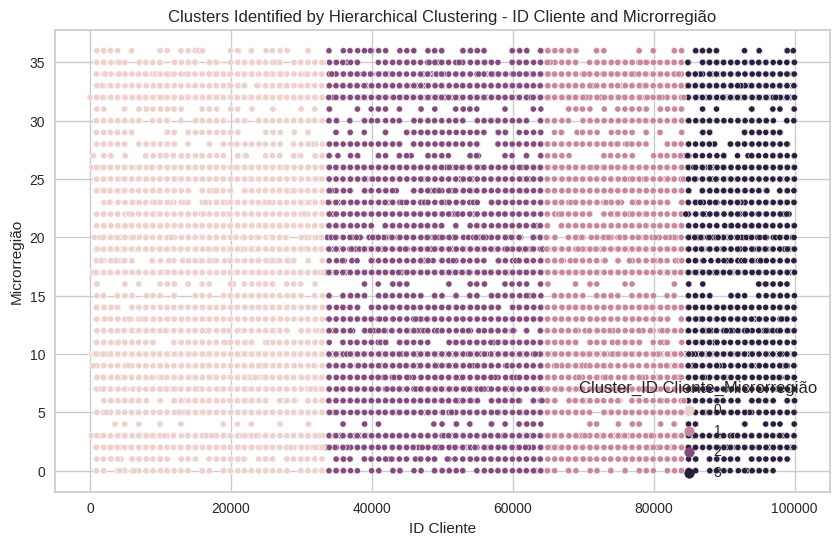

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



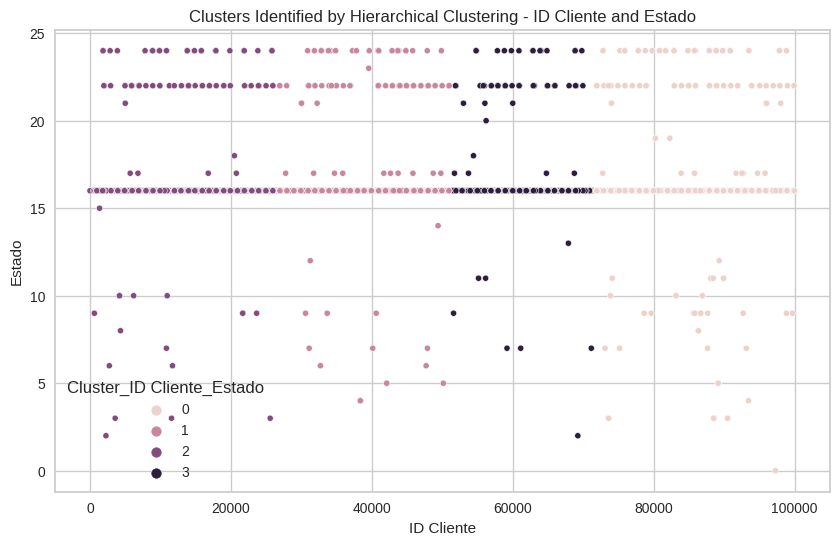

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



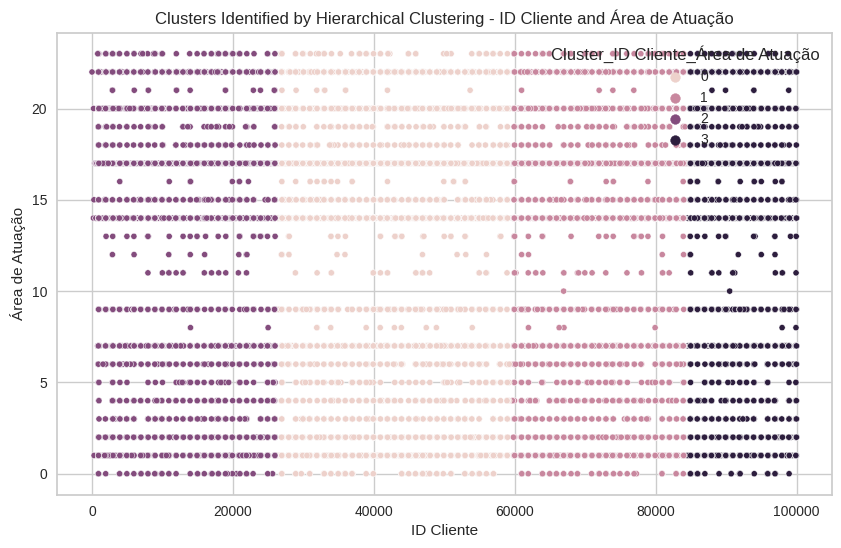

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



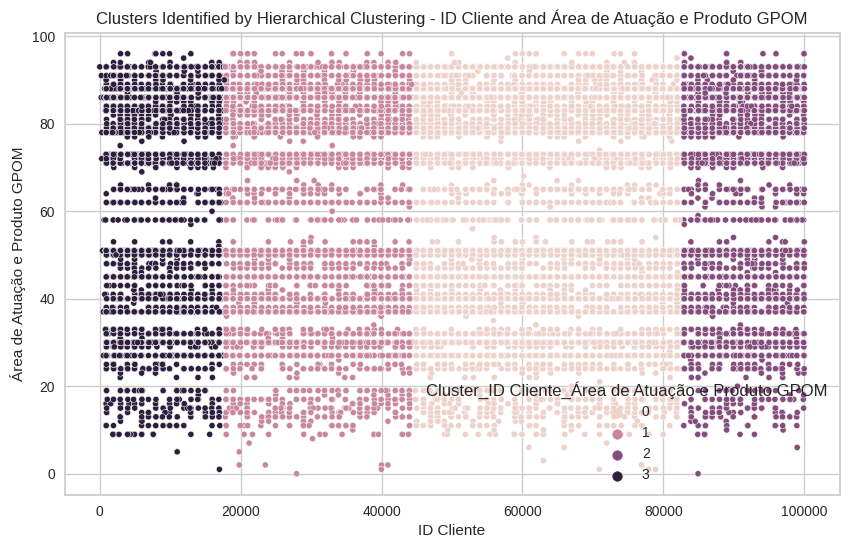

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



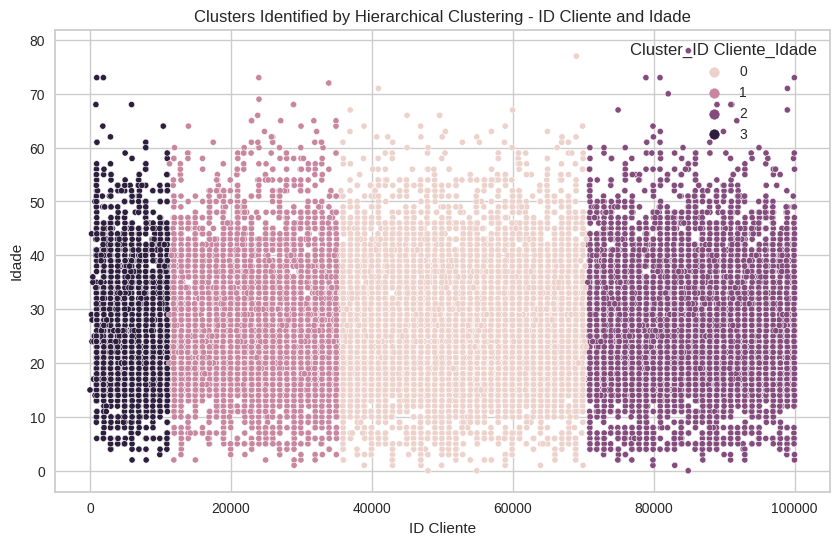

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



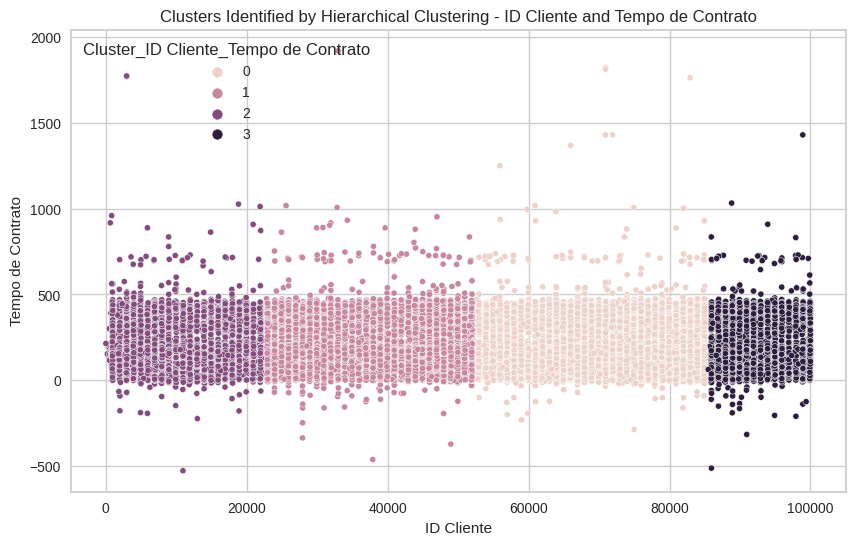

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



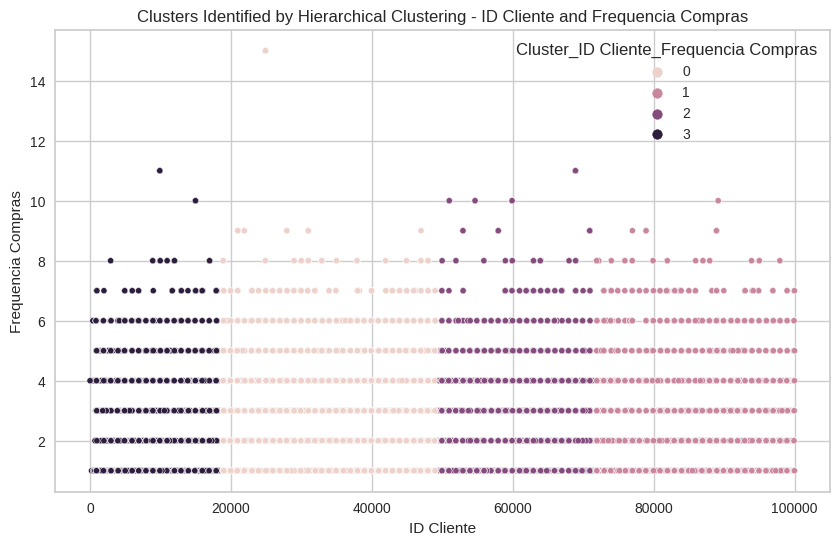

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



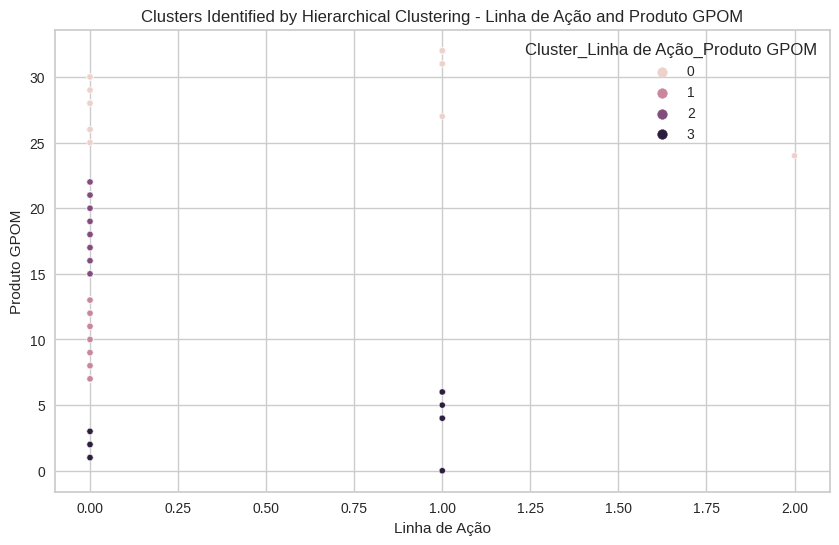

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



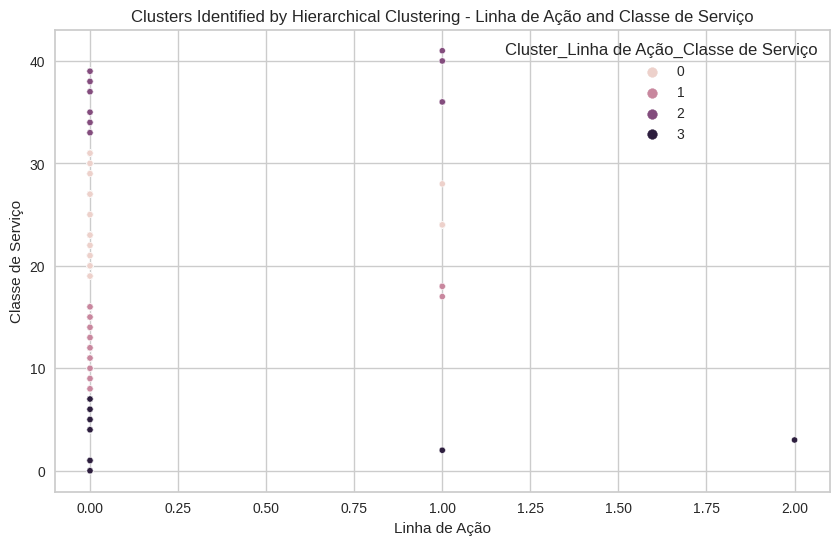

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



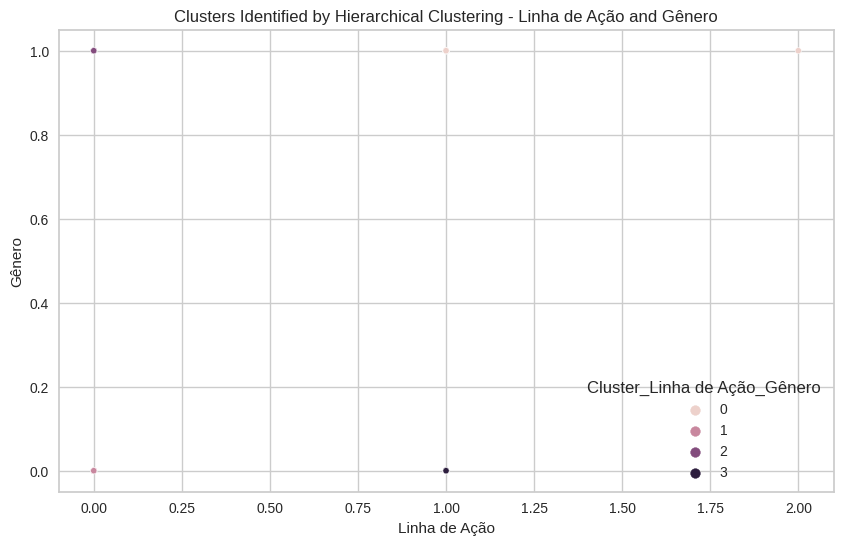

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



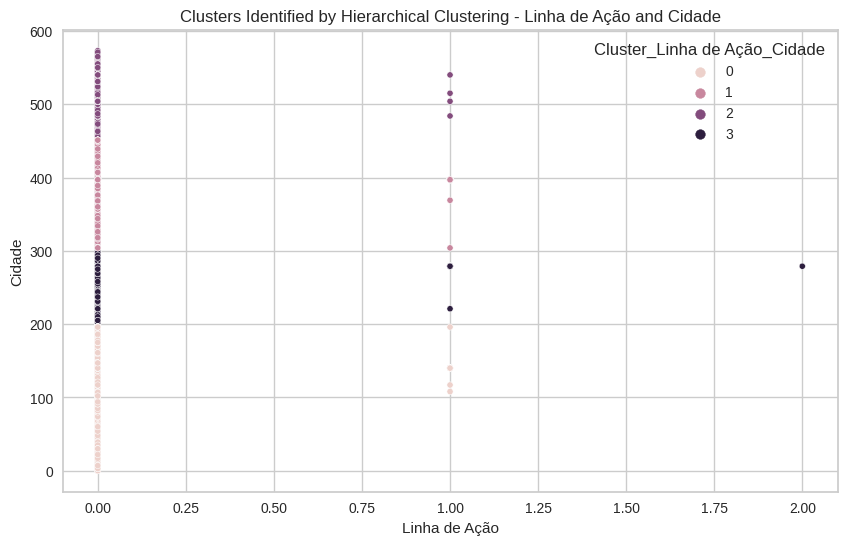

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



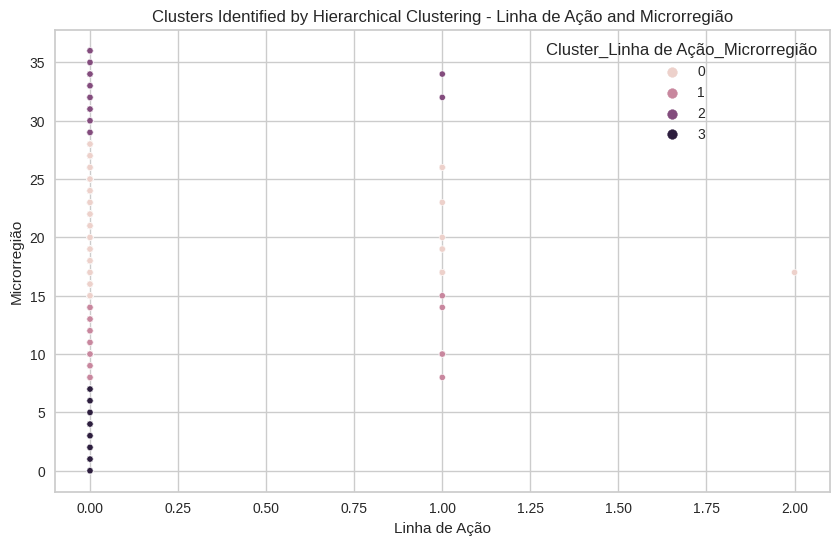

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



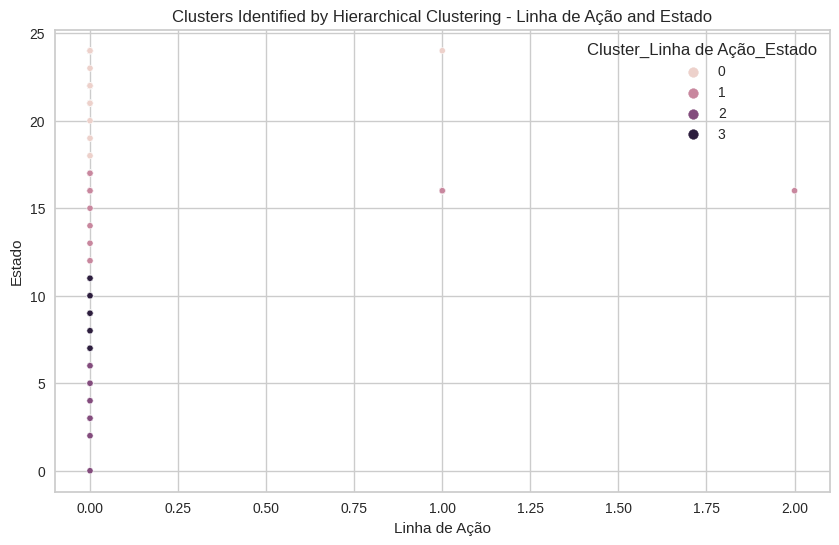

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



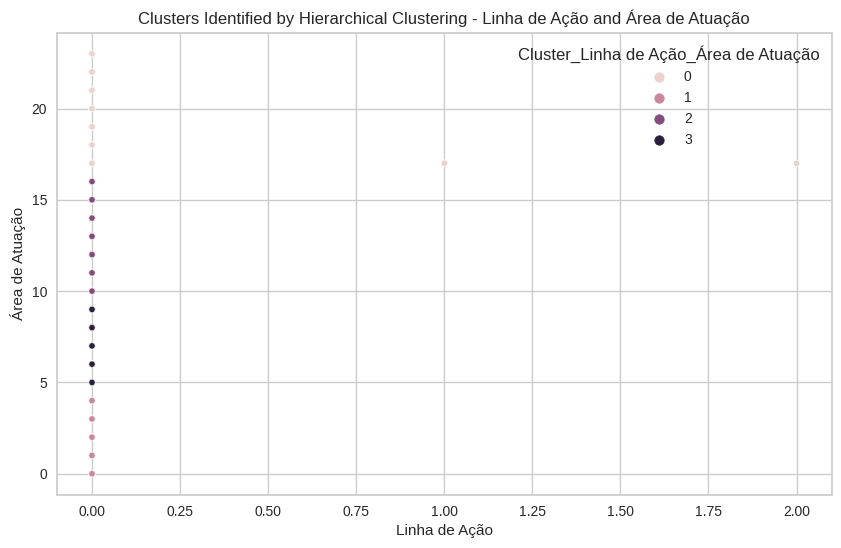

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



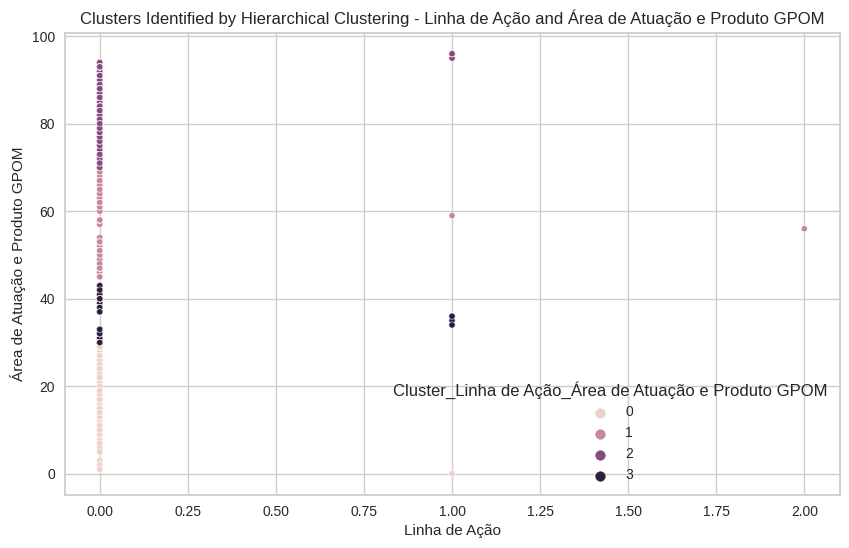

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



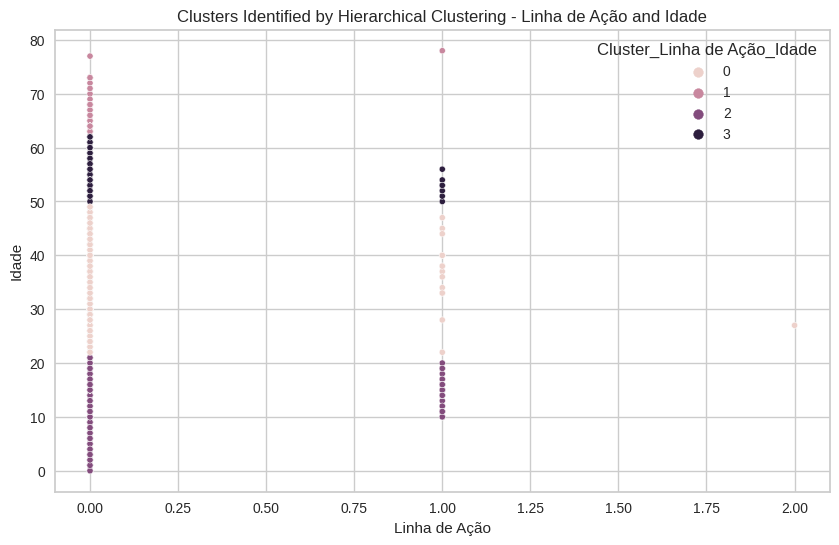

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



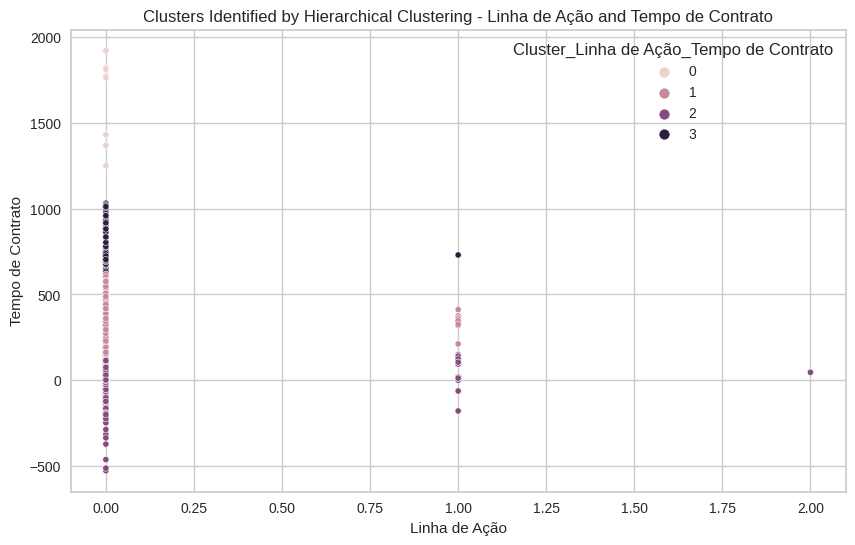

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



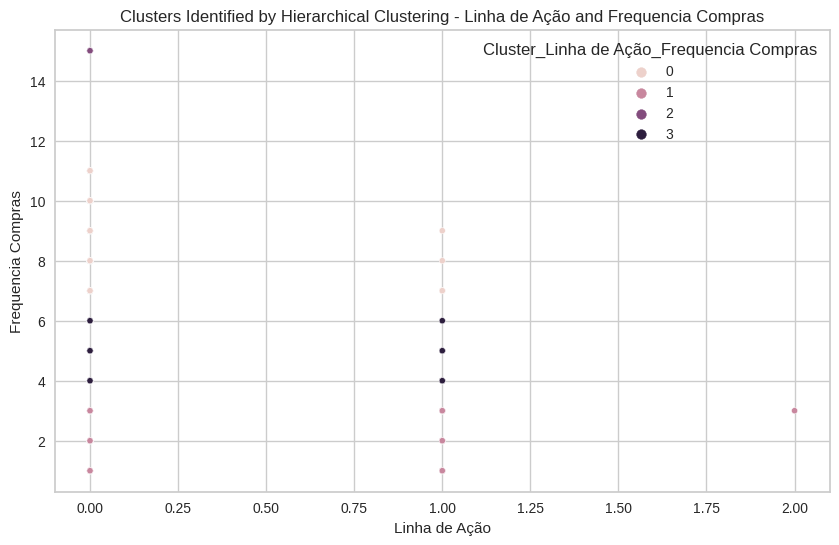

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



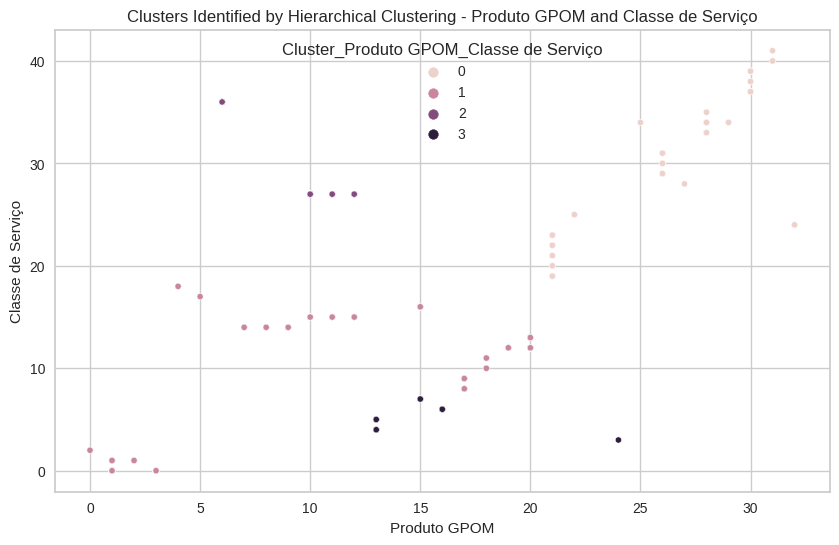

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



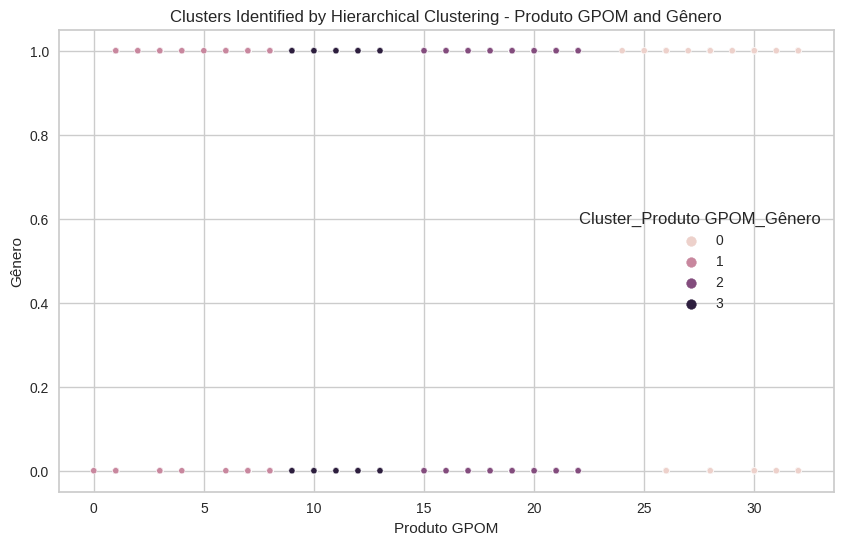

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



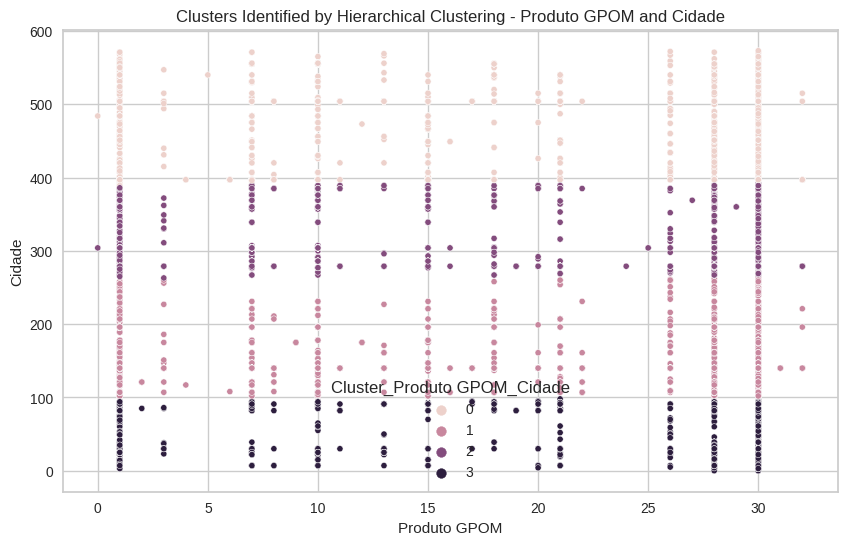

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



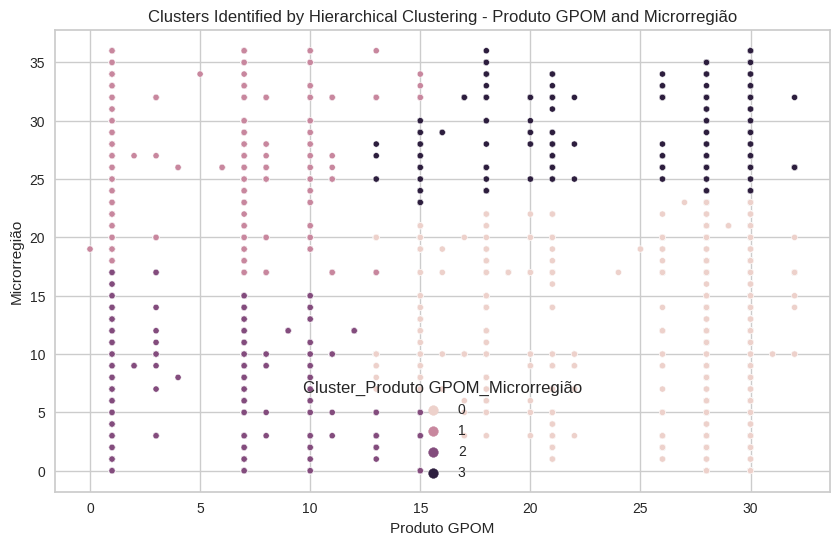

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



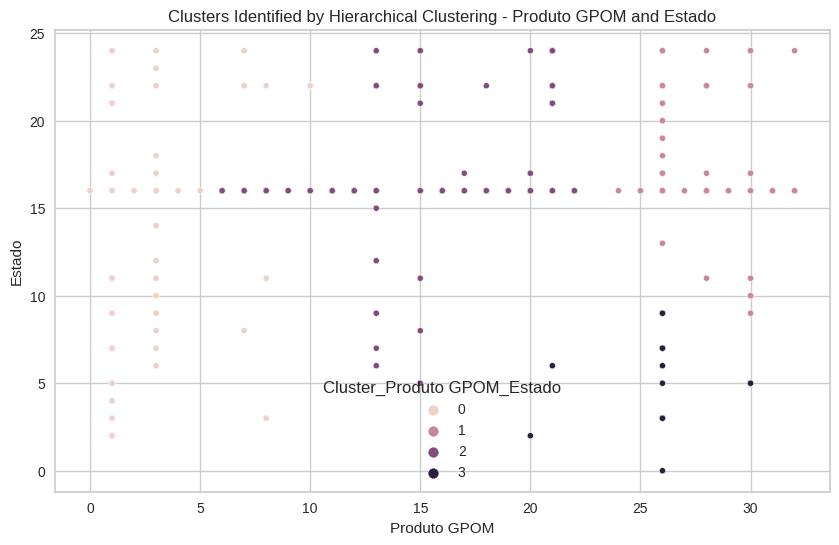

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



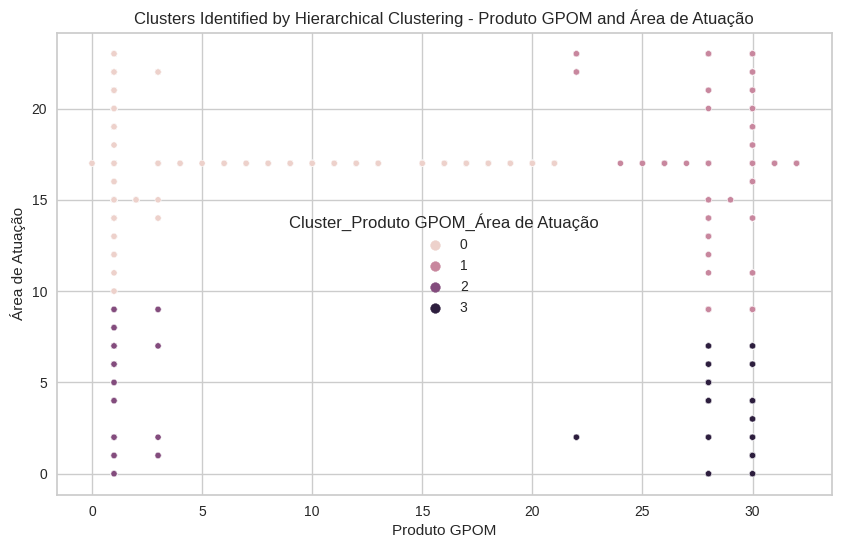

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



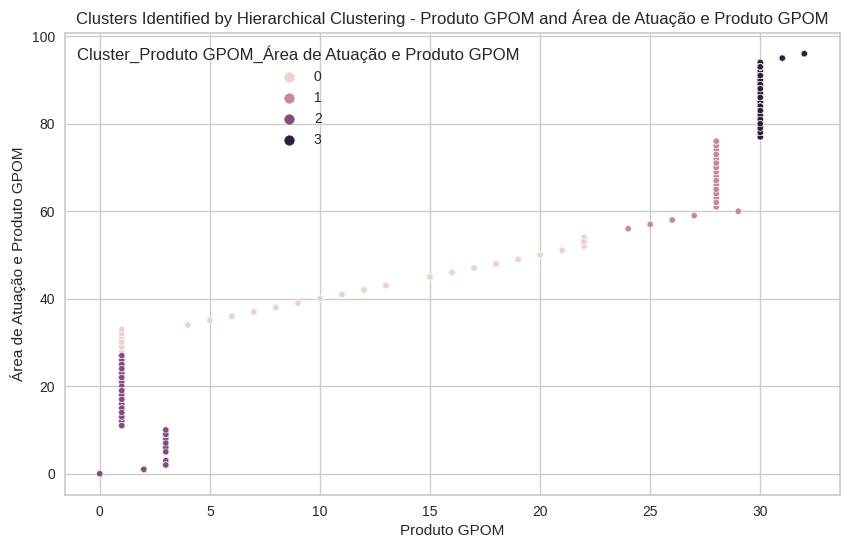

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



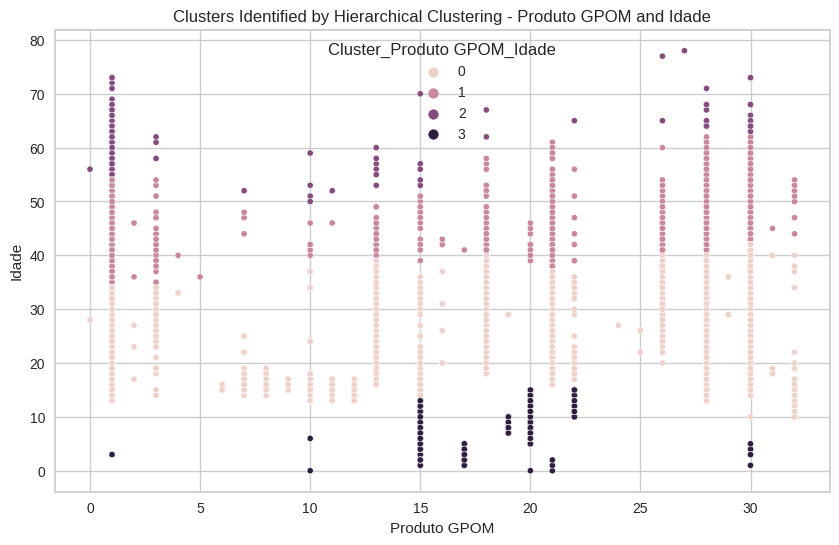

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



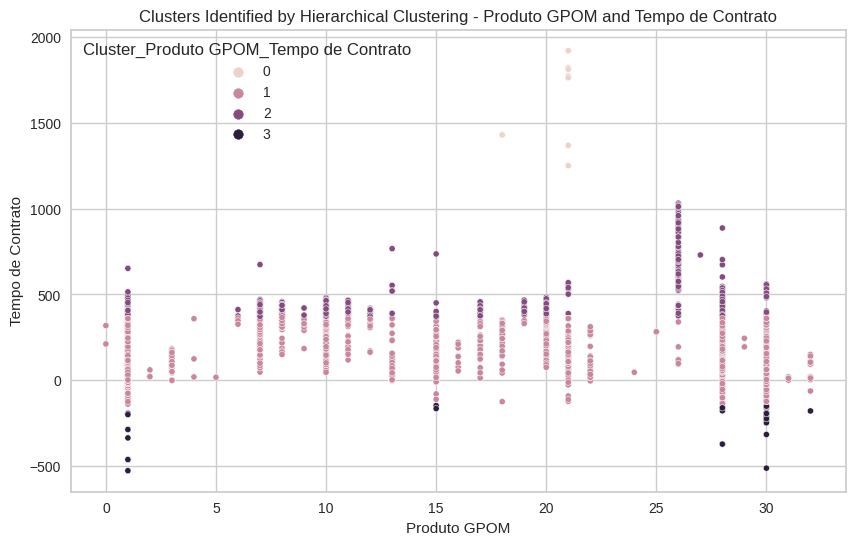

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



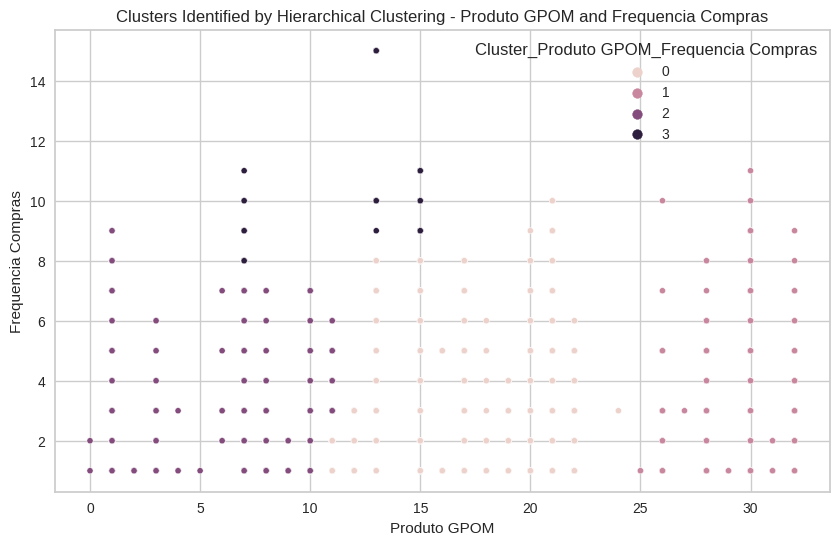

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



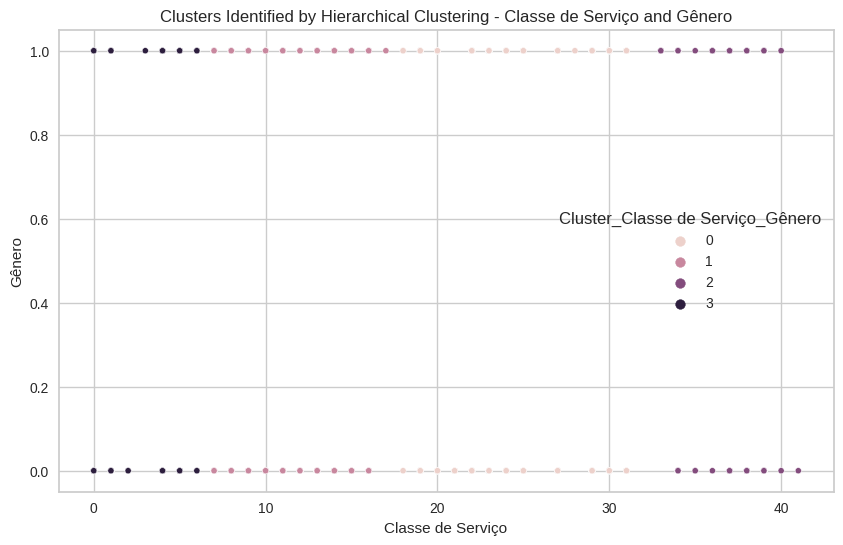

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



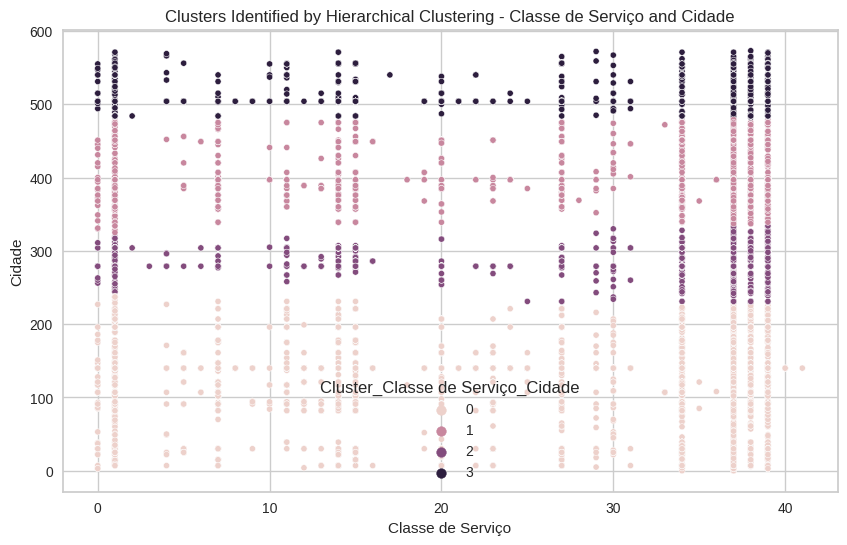

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



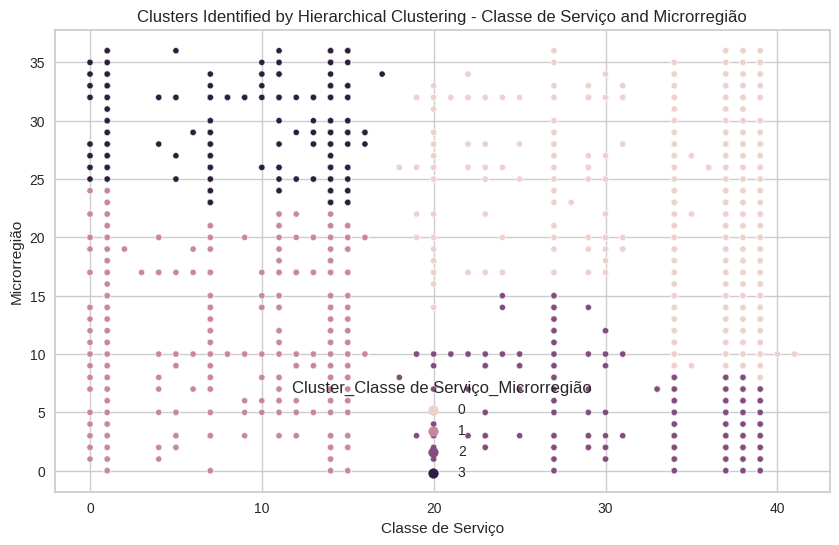

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



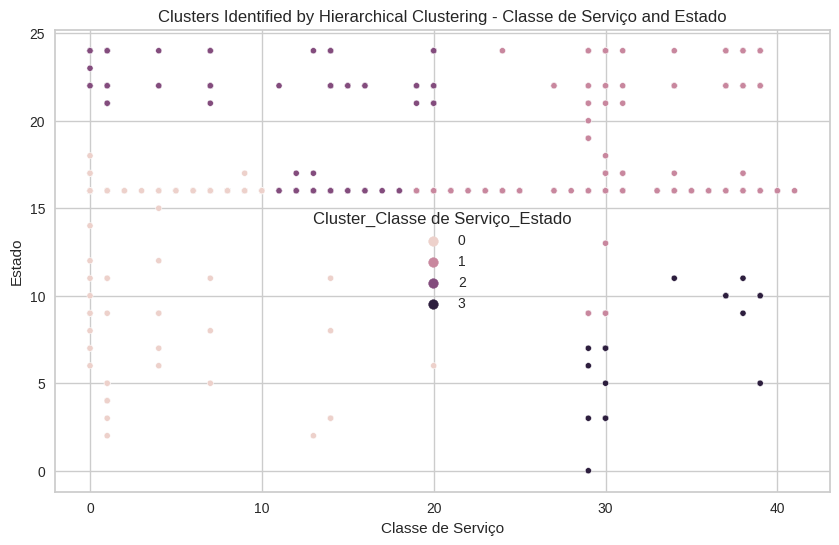

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



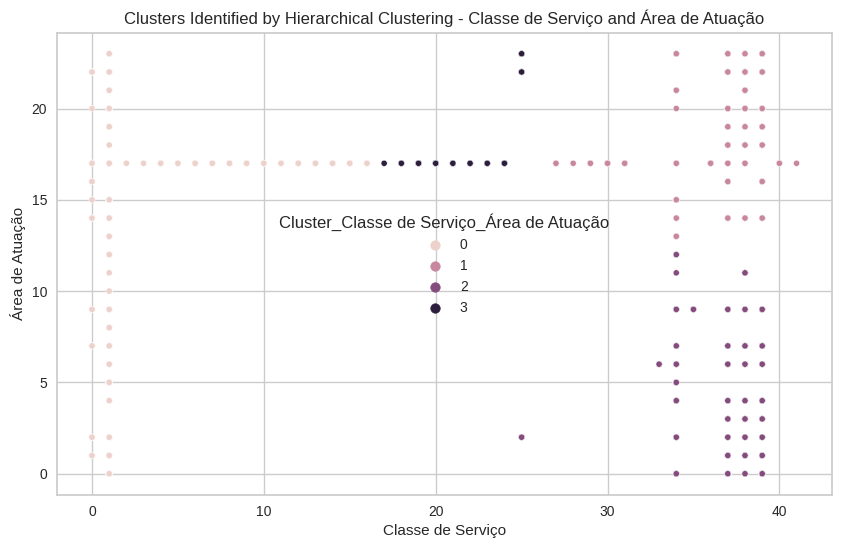

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



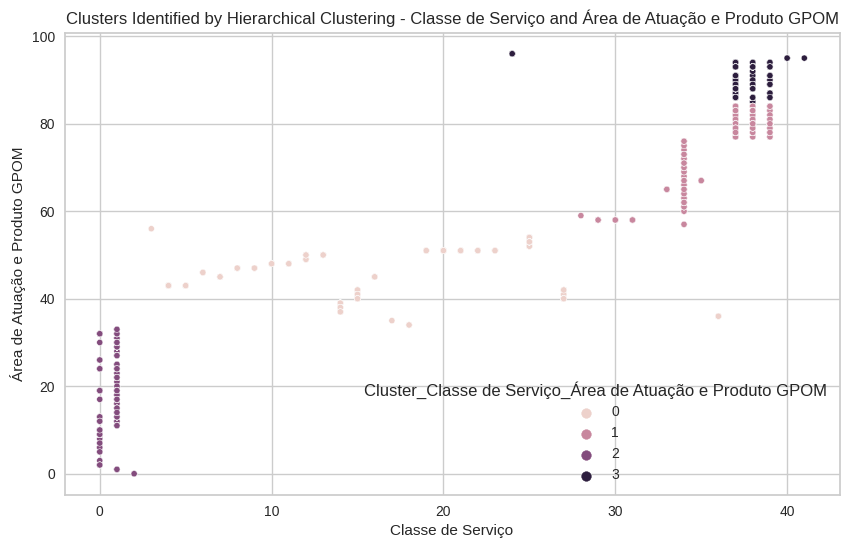

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



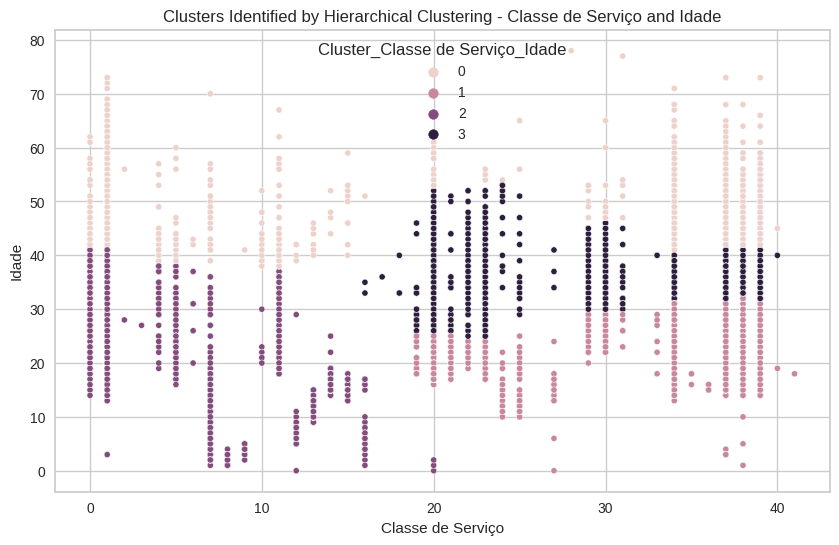

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



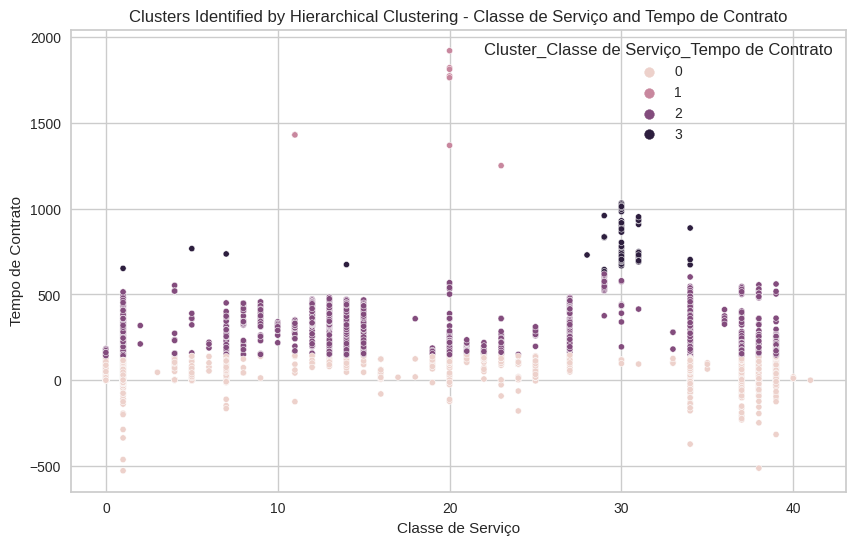

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



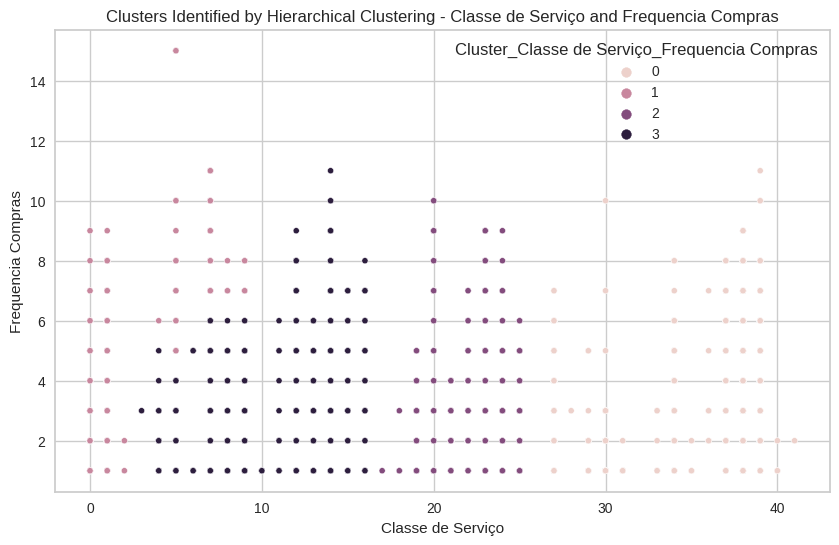

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



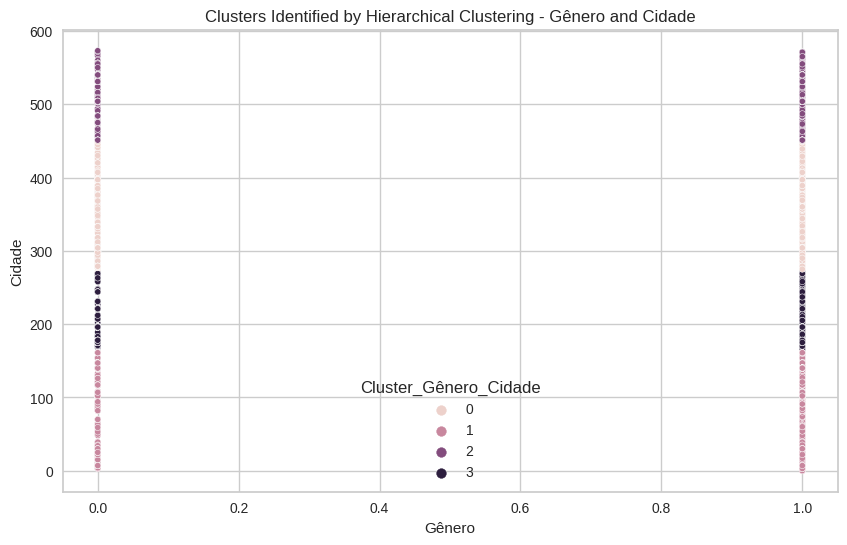

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



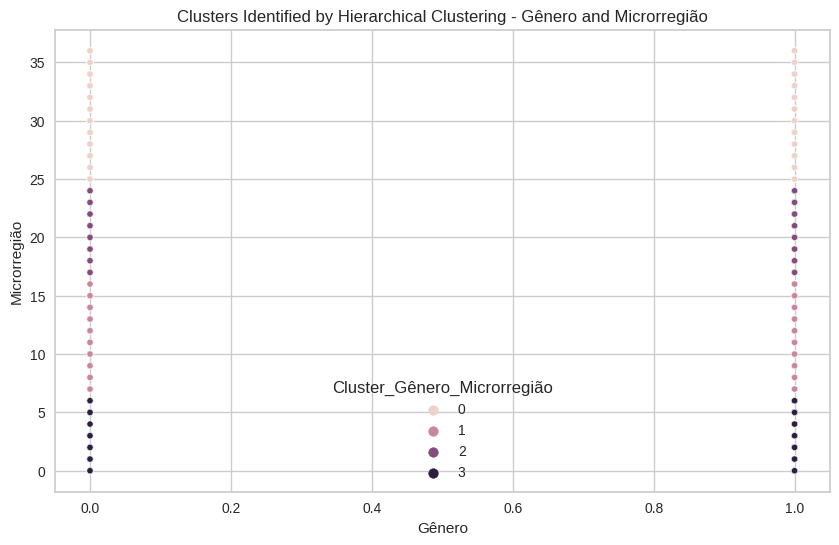

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



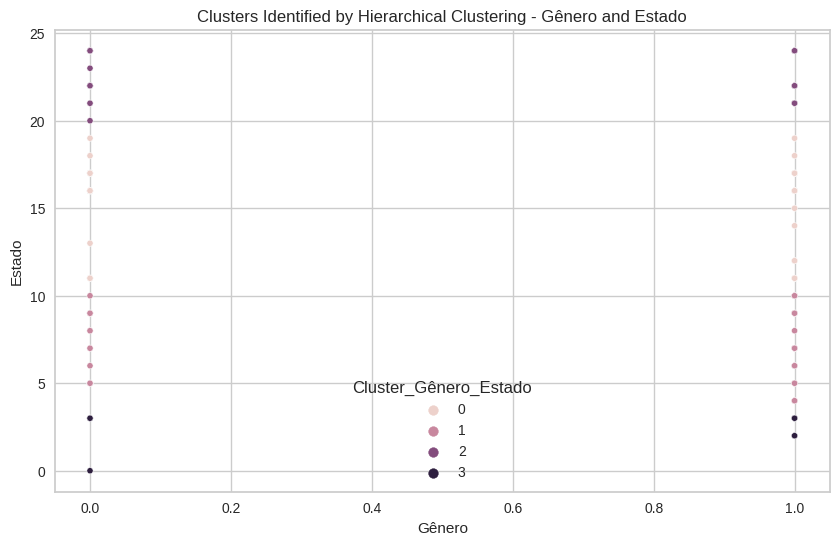

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



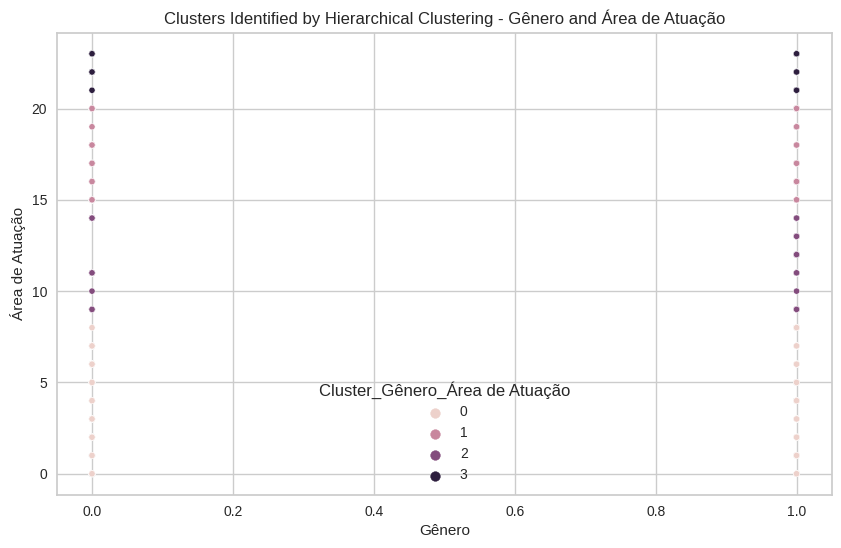

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



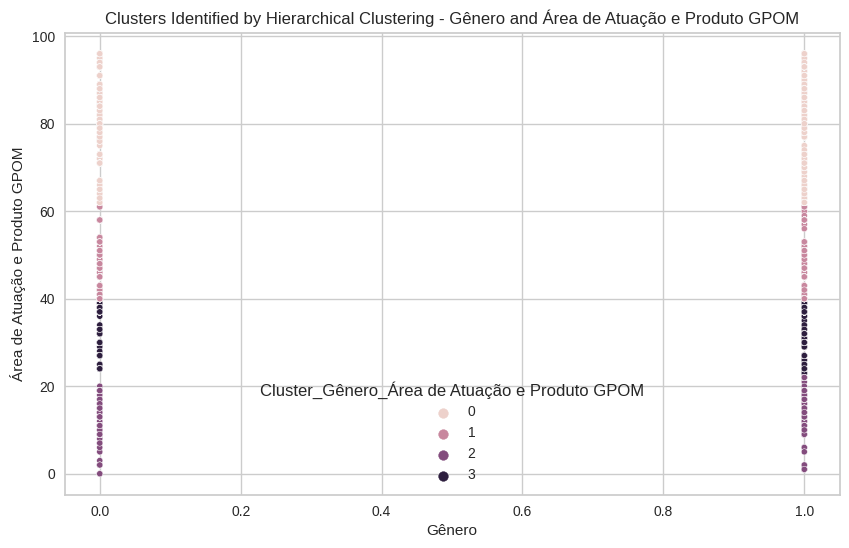

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



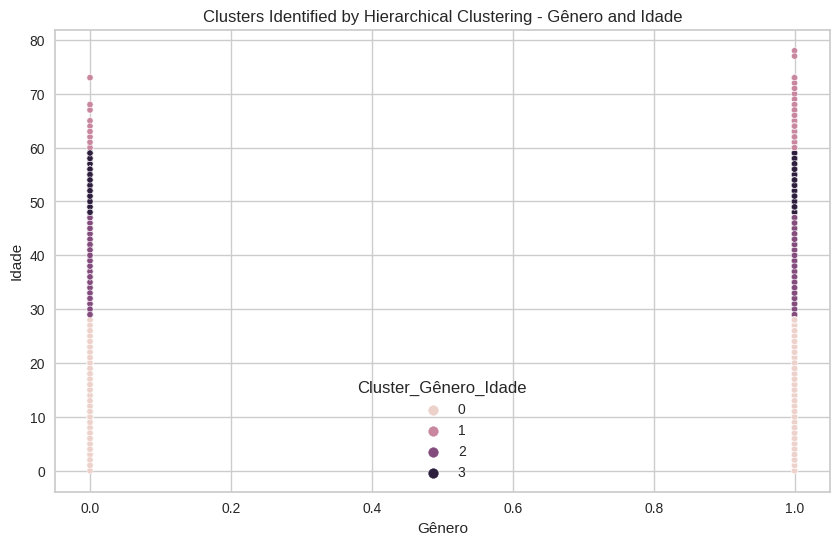

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



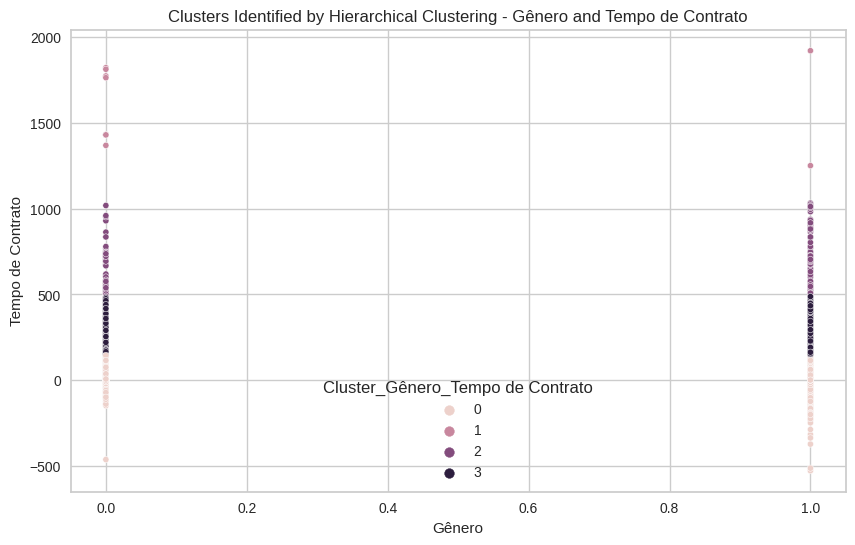

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



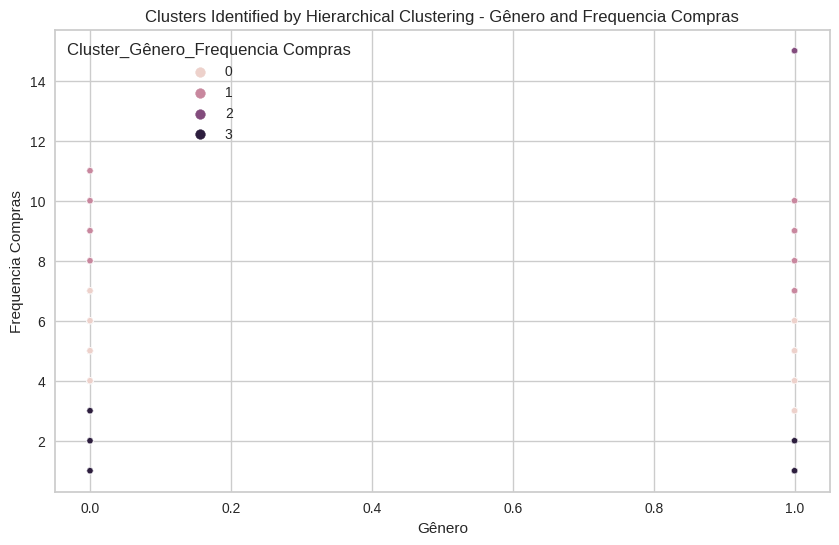

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



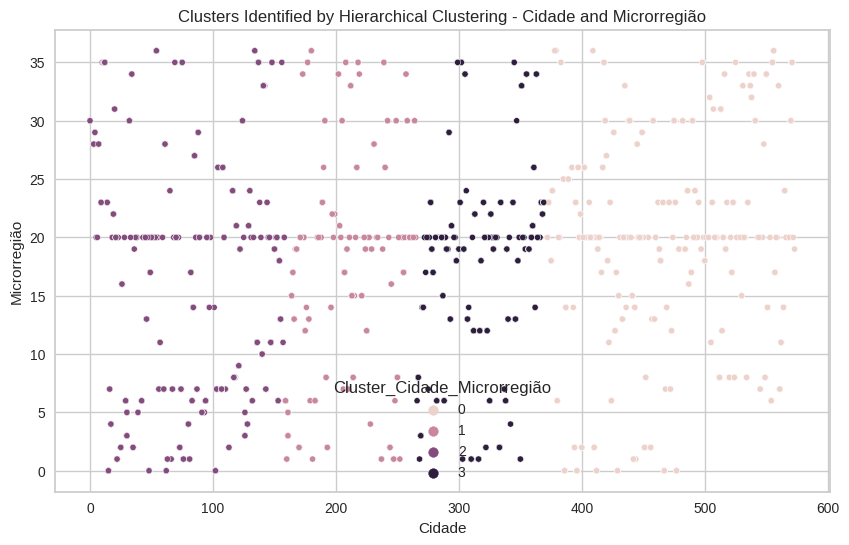

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



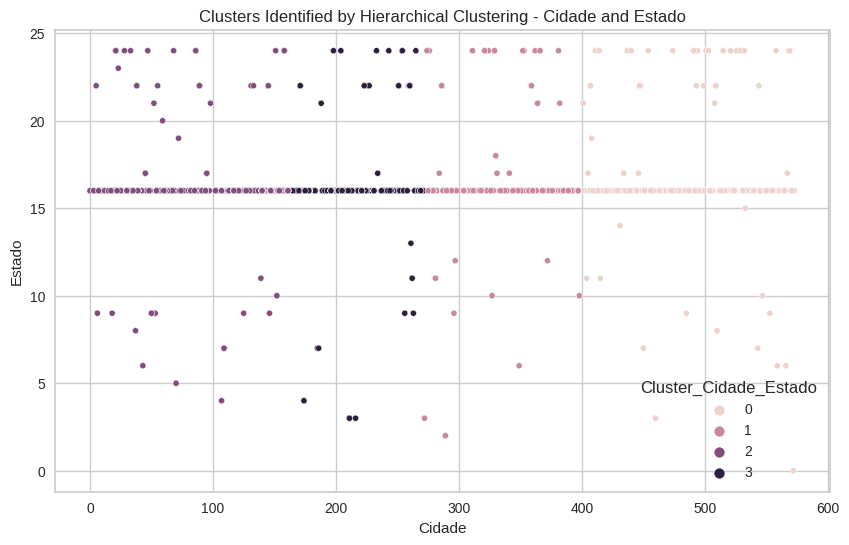

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



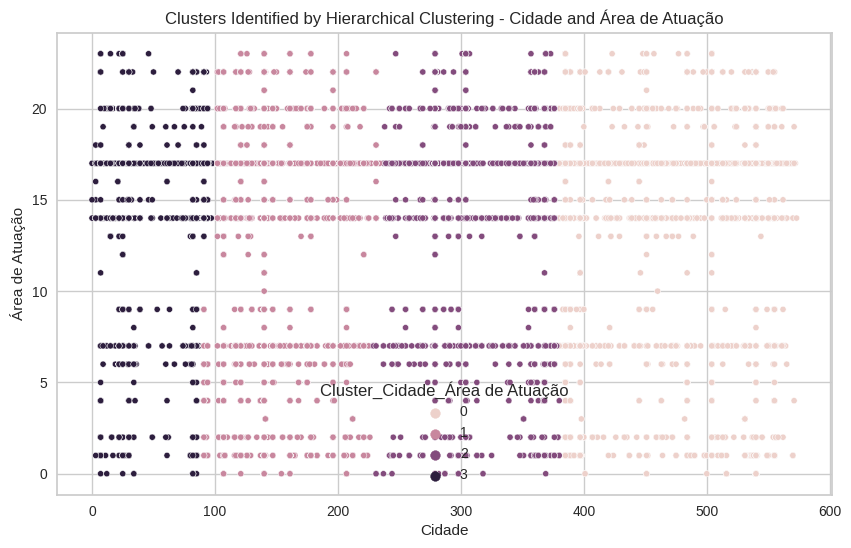

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



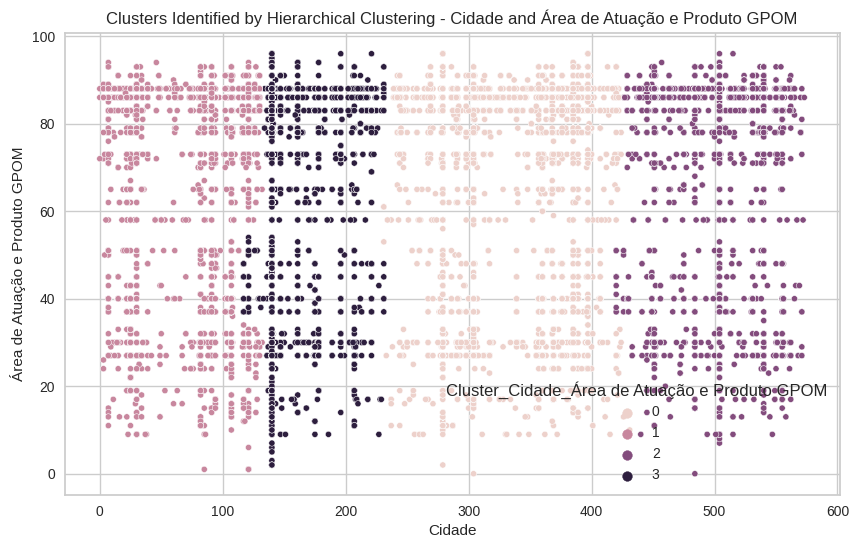

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



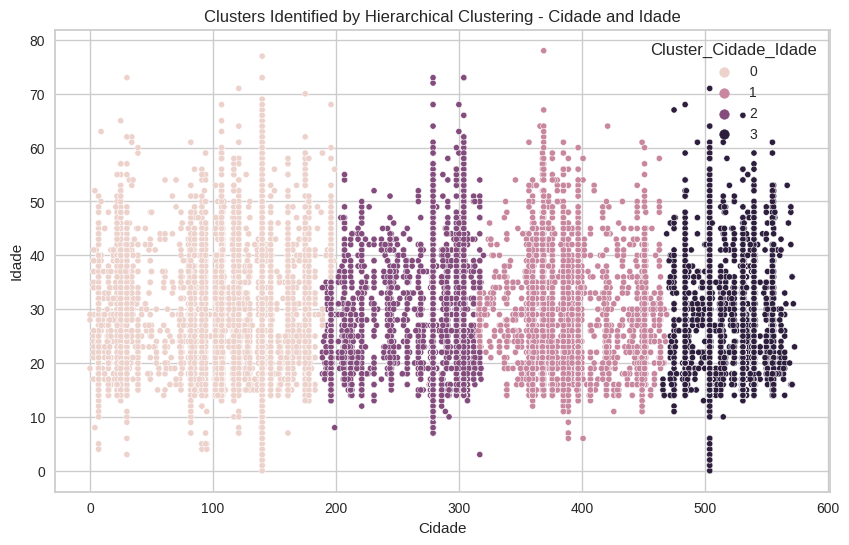

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



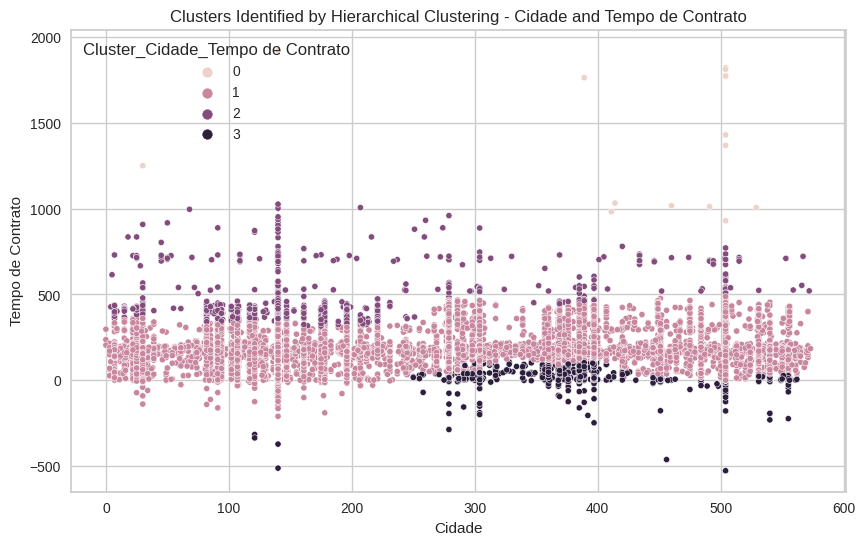

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



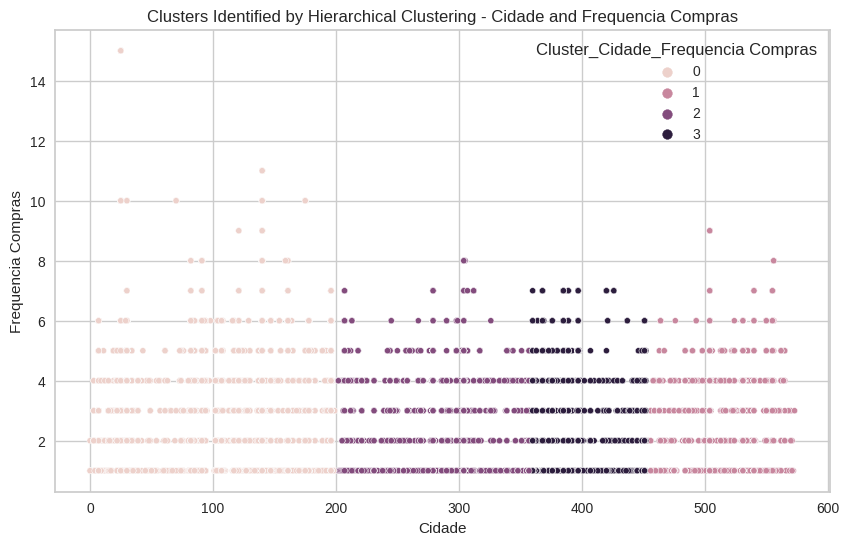

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



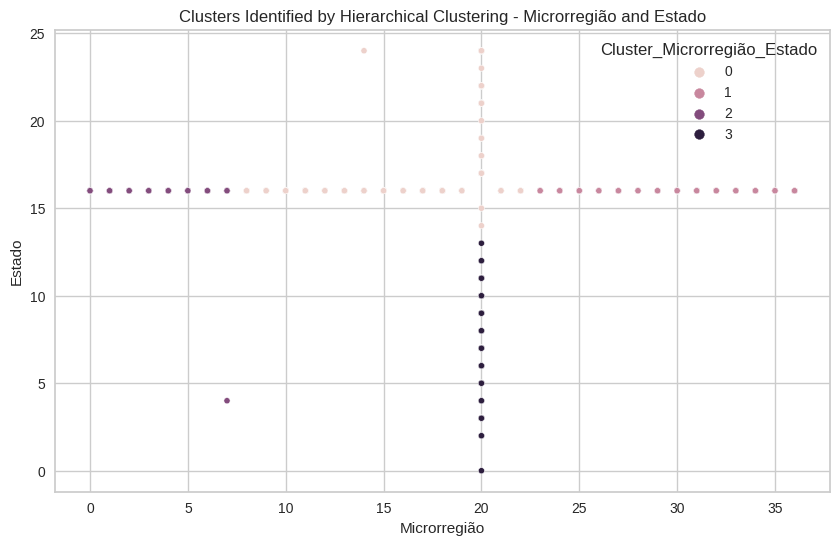

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



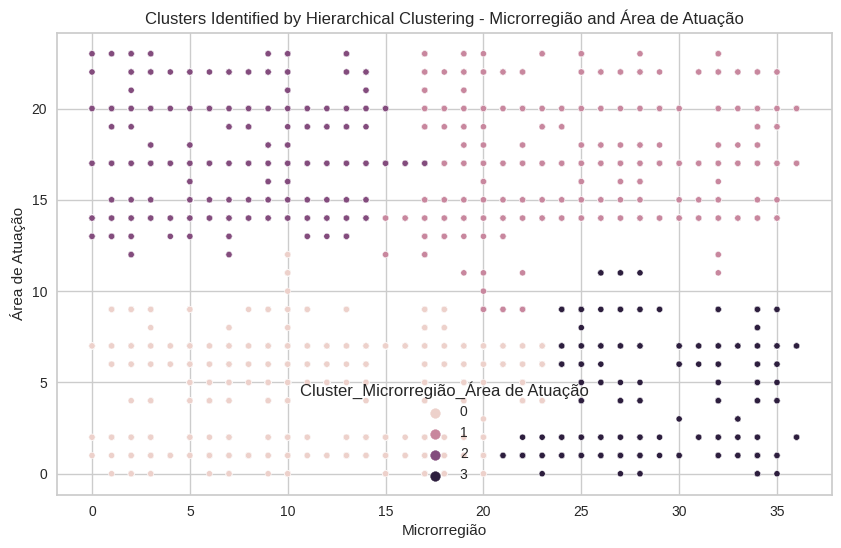

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



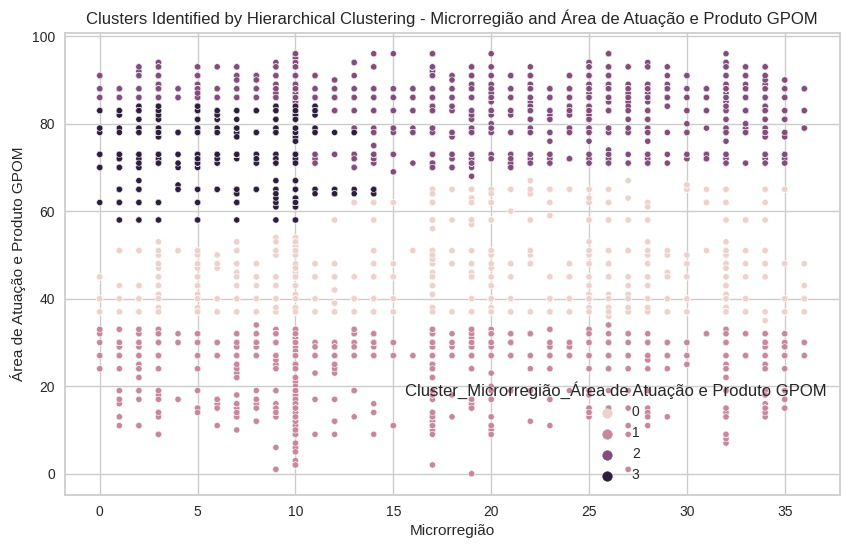

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



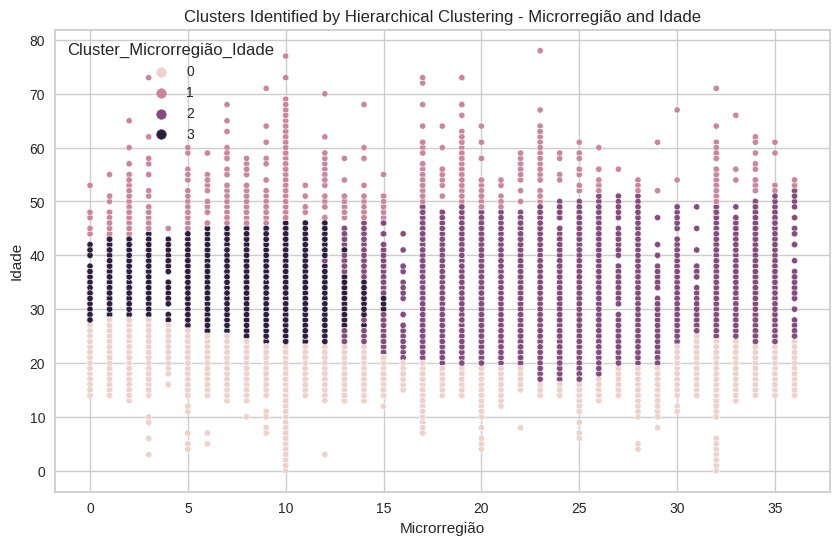

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



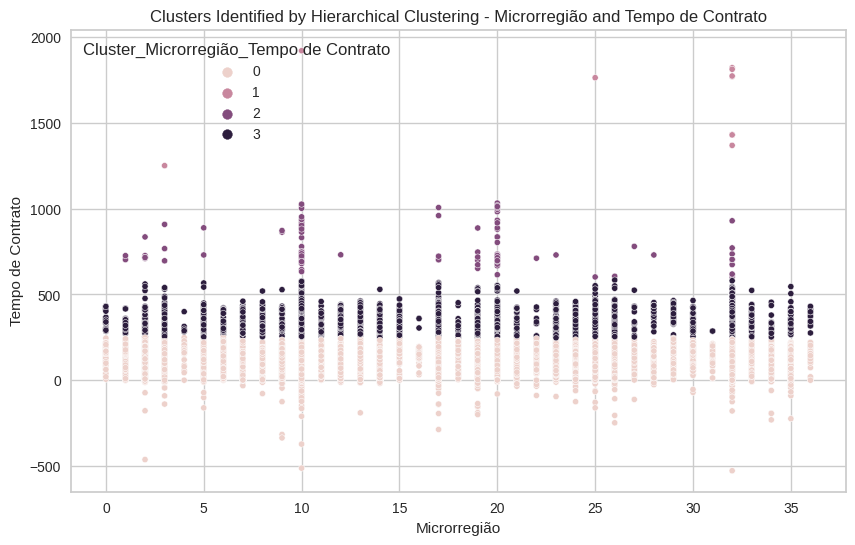

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



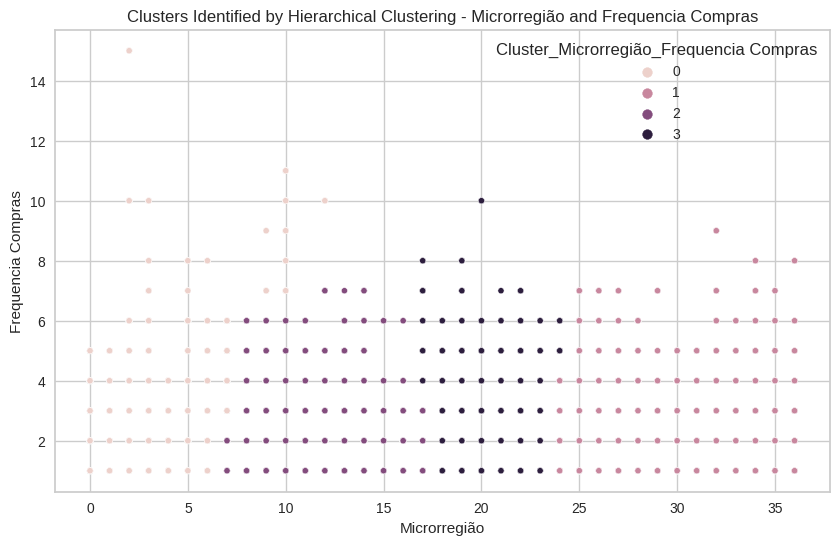

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



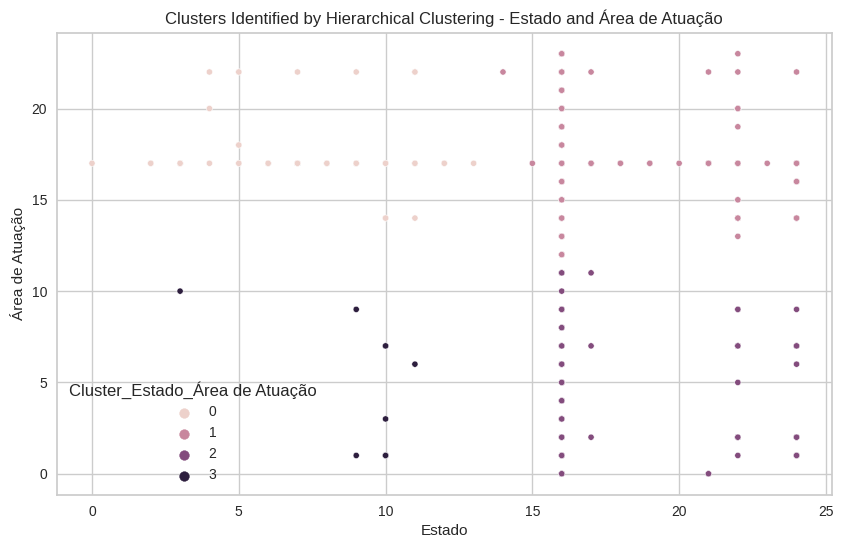

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



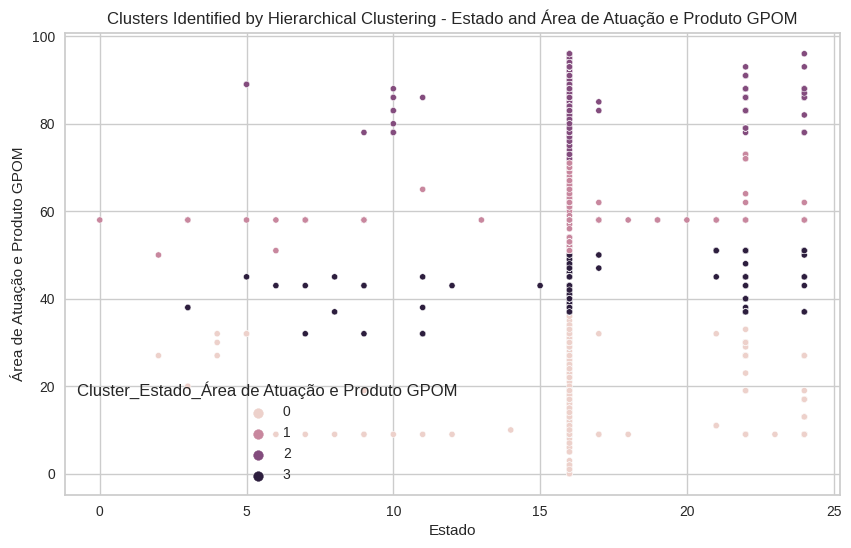

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



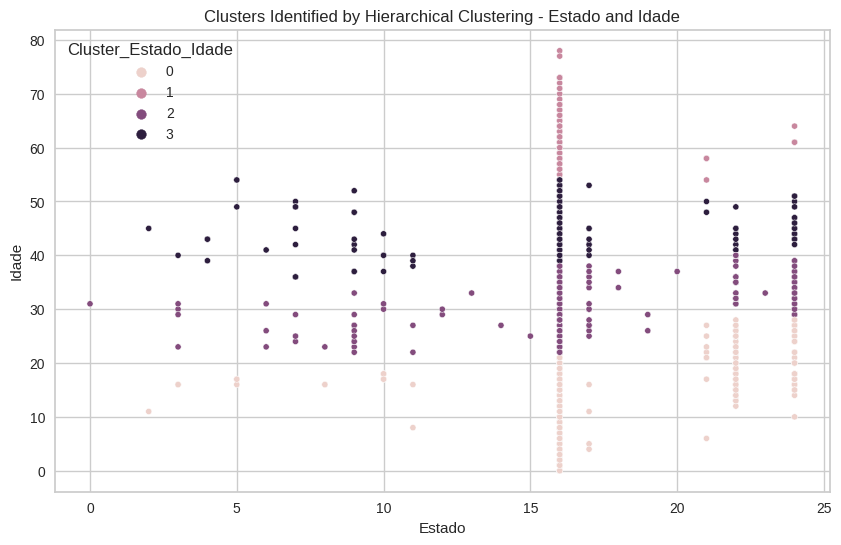

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



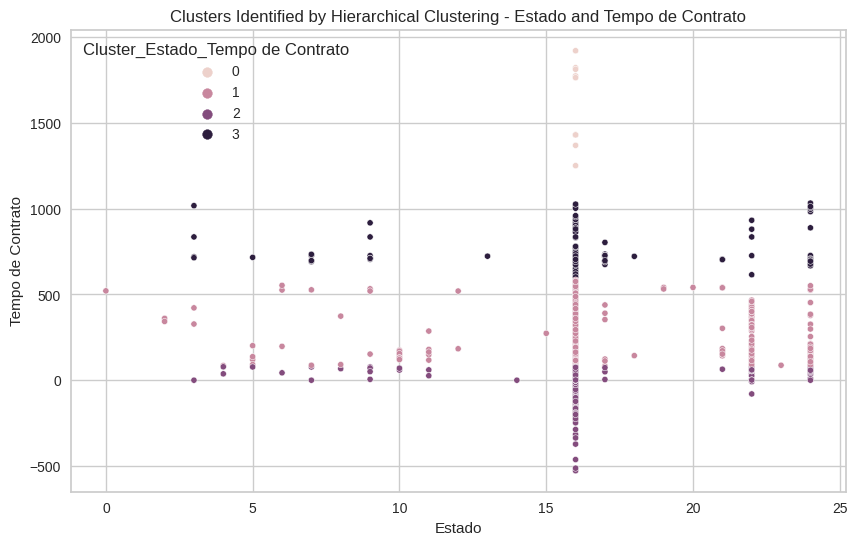

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



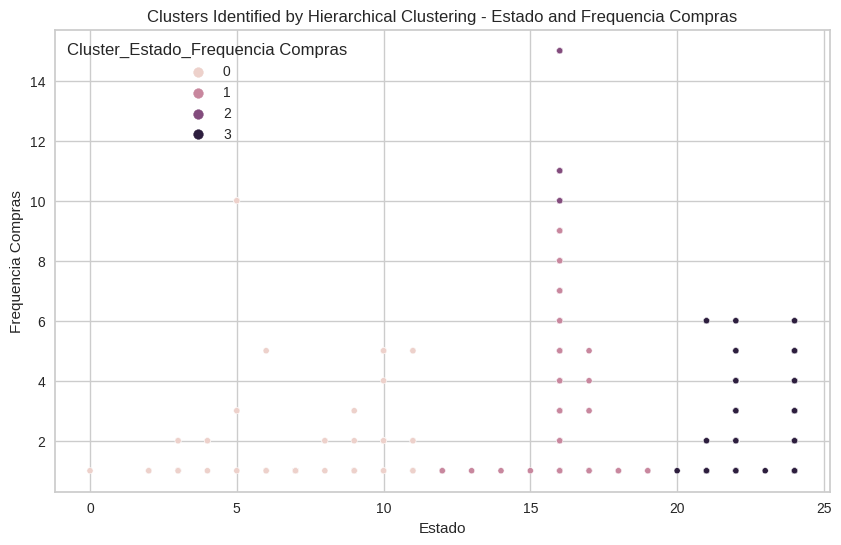

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



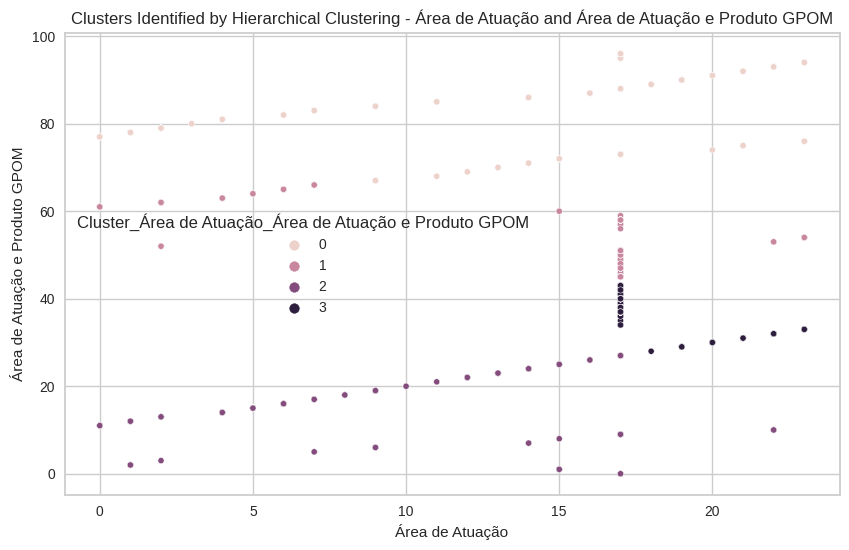

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



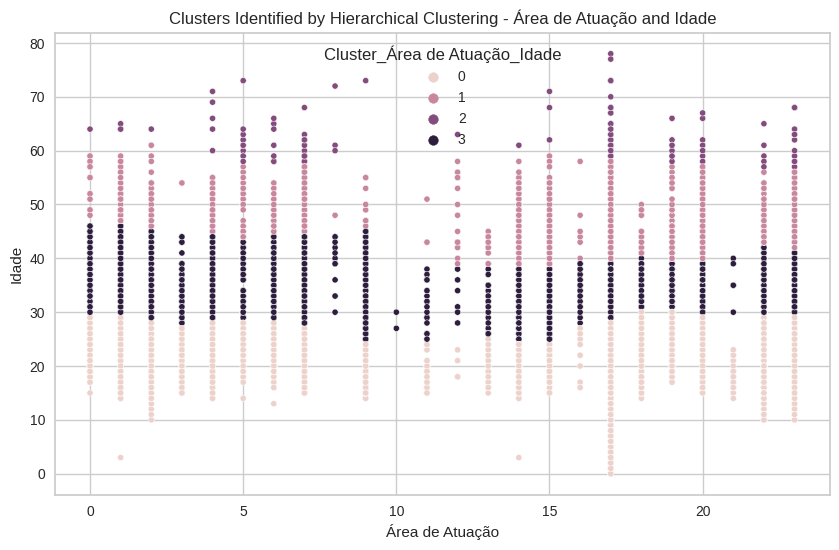

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



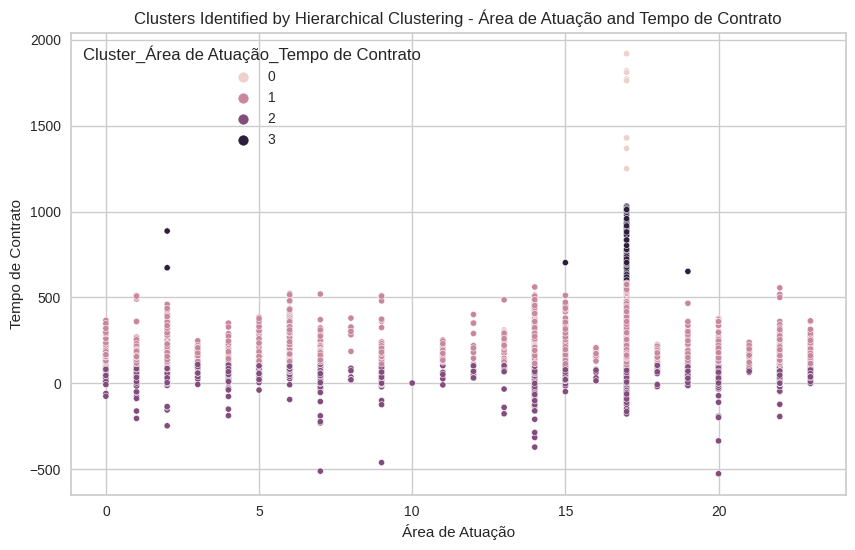

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



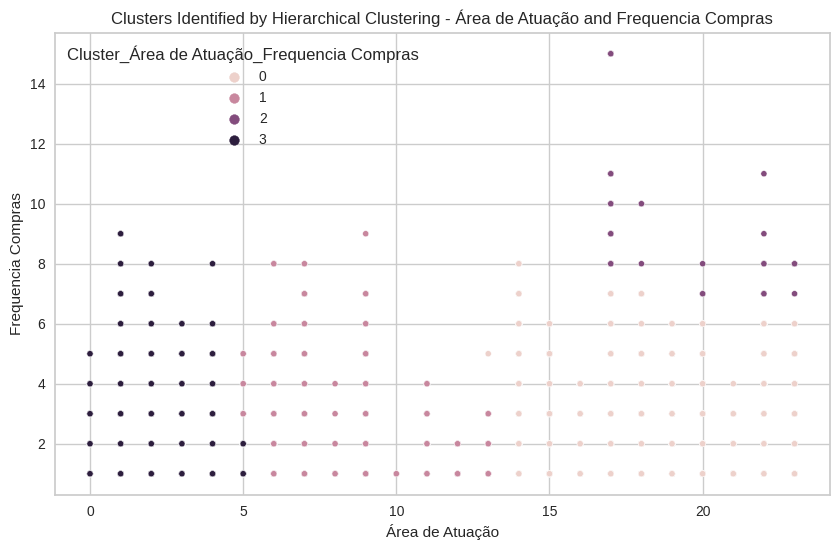

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



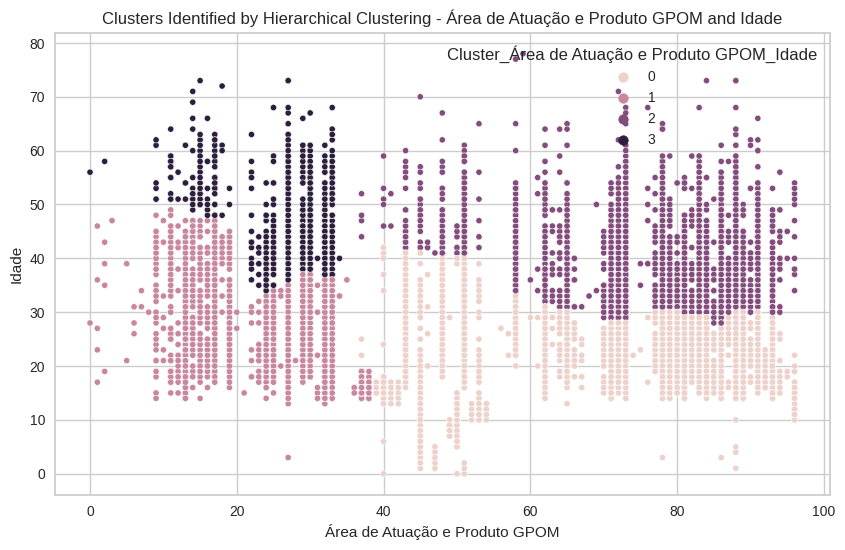

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



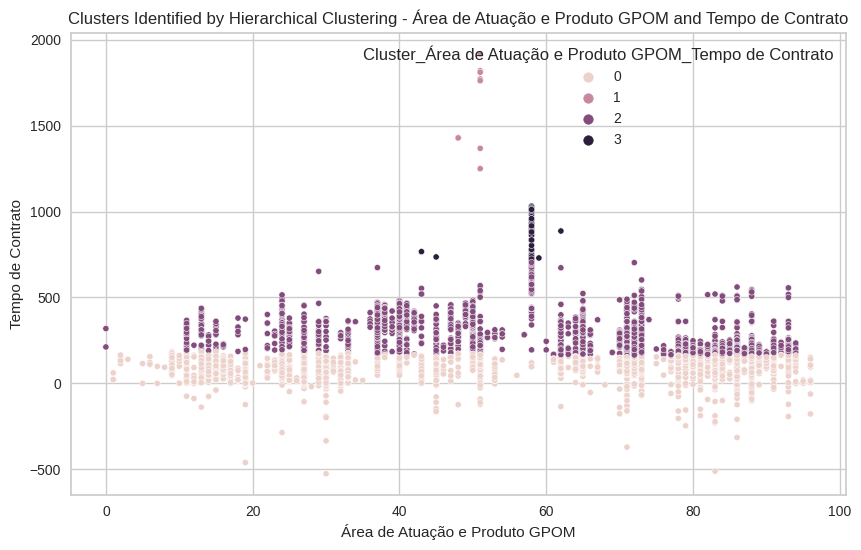

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



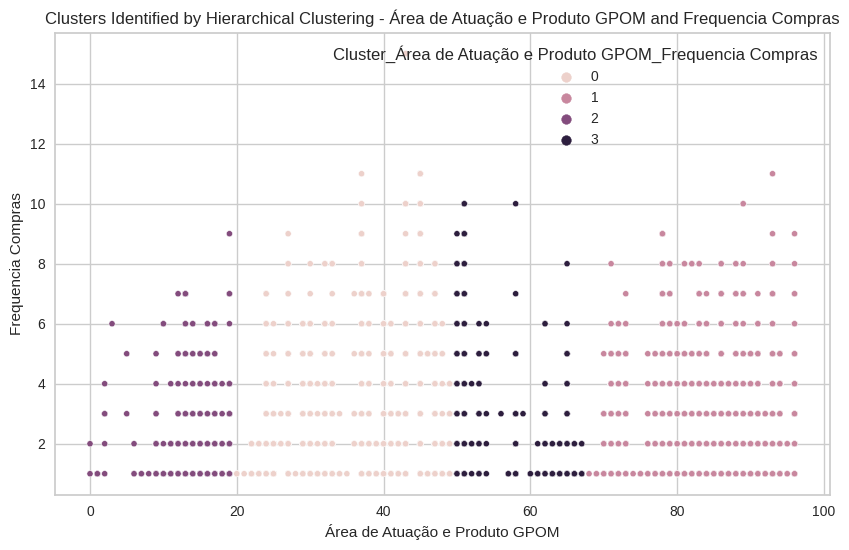

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



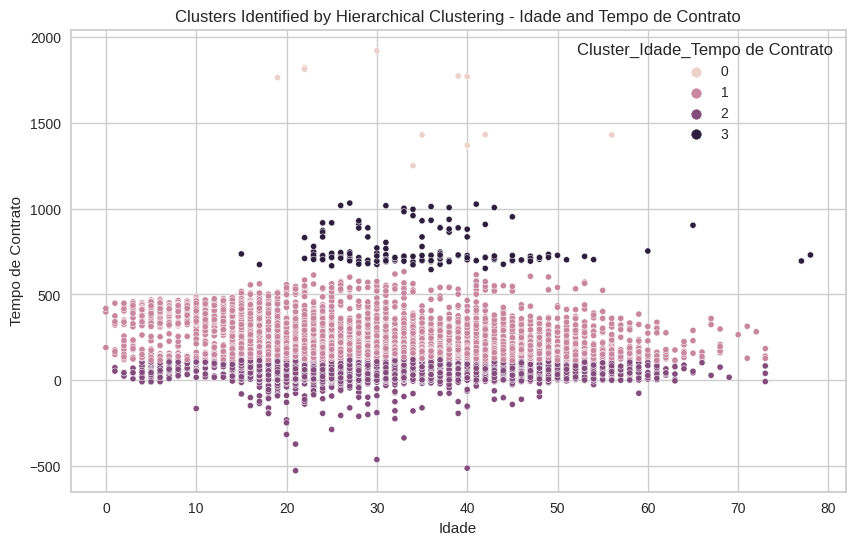

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



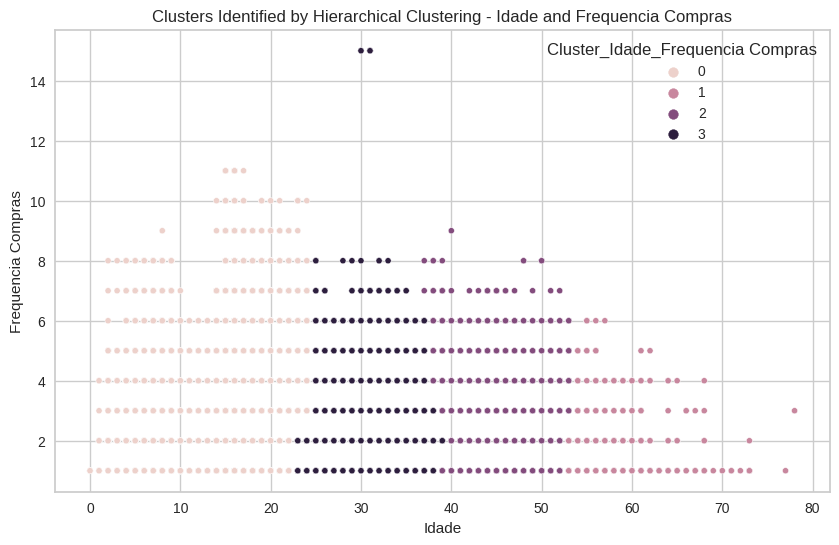

/home/hub/anaconda3/lib/python3.11/site-packages/seaborn/relational.py:573: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



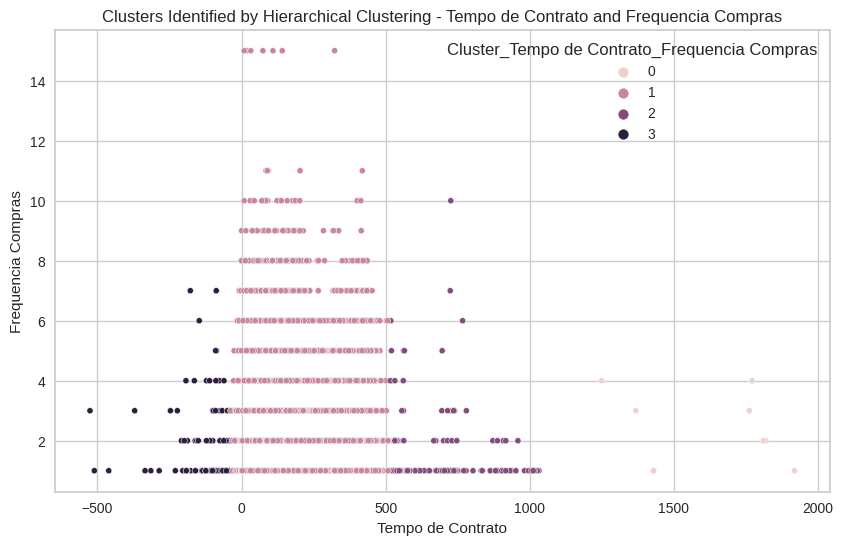

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering

# Supondo que 'df_pf' seja o seu DataFrame
colunas = ['ID Cliente', 'Linha de Ação', 'Produto GPOM', 'Classe de Serviço',
           'Gênero', 'Cidade', 'Microrregião', 'Estado', 'Área de Atuação',
           'Área de Atuação e Produto GPOM', 'Idade', 'Tempo de Contrato',
           'Frequencia Compras']

# Sample a portion of the dataframe
sampled_df = df_pf.sample(frac=0.4)  # Ajuste a fração conforme necessário

# Iterar sobre cada par de colunas consecutivas
for i in range(len(colunas) - 1):
    for j in range(i + 1, len(colunas)):
        coluna1 = colunas[i]
        coluna2 = colunas[j]

        # Perform clustering on the sampled data for the pair of columns
        X_pair = sampled_df[[coluna1, coluna2]].values
        agg_clustering = AgglomerativeClustering(n_clusters=4, linkage='complete')
        sampled_df[f'Cluster_{coluna1}_{coluna2}'] = agg_clustering.fit_predict(X_pair)

        # Visualize the clusters for the current pair of columns
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=coluna1, y=coluna2, hue=f'Cluster_{coluna1}_{coluna2}', data=sampled_df, cmap='viridis', s=20)
        plt.title(f'Clusters Identified by Hierarchical Clustering - {coluna1} and {coluna2}')
        plt.show()
